In [5]:
import os
import joblib
import pickle
import dill

import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
from matplotlib import gridspec

import pandas as pd
from pingouin import mixed_anova, anova, pairwise_tukey, pairwise_tests
import pingouin as pg
from statsmodels.regression.mixed_linear_model import MixedLM

import TwoPUtils as tpu
import STX3KO_analyses as stx
from STX3KO_analyses import utilities as u



plt.rcParams['pdf.fonttype']=42
ko_mice = stx.ymaze_sess_deets.ko_mice

ctrl_mice = stx.ymaze_sess_deets.ctrl_mice
# ctrl_mice = [m for m in ctrl_mice if m not in ('mCherry6')]

%matplotlib inline

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
figdir = "/mnt/BigDisk/YMazeResults/neural/replay"
os.makedirs(figdir,exist_ok=True)

In [7]:
#  write HSE to be any stopping period > 1 sec

#  Plot some examples
#  sort by whether cell participates or not
#  sort within participants and non-participants by location of place field


#  Plot size of events and proportion greater than chance

#  Frequency & duration of events

# % of population in HSEs

# % of HSEs that each cell participates in 

# activity rate of participants vs non-participants

# trial x trial correlation of participants vs non-participants
    # get some examples
    

# predicting stability across days from HSE participation

In [8]:
class HSE:
    
    def __init__(self, sess):
        
        if isinstance(sess.scan_info,list):
            self.frame_rate = sess.scan_info[0]['frame_rate']
        else:
            self.frame_rate = sess.scan_info['frame_rate']
        
        
        
        
        self.spks = sess.timeseries['spks']
        self.trial_mat = sess.trial_matrices['spks_nostop']
        self.speed = sess.timeseries['speed']
        self.lr = sess.timeseries['LR'].ravel()
        self.t = sess.timeseries['t'].ravel()
        self.reward = sess.timeseries['reward'].ravel()
        self.block_number = sess.timeseries['block_number'].ravel()
        
        self.novel_arm = sess.novel_arm
        self.trial_info = sess.trial_info
        self.trial_start_inds = sess.trial_start_inds
        self.teleport_inds = sess.teleport_inds
        
        
        # mask for post reward epochs
        self.post_reward_bool = None
        self.post_reward_epochs = None
        self._post_reward_mask(sess)
        
        
        # threshold spks timeseries to get "significant" transients
        self.thresh_spks = .2*np.nanmax(sess.timeseries['spks'], axis=-1, keepdims=True)
        self.spks_th = 1.*np.copy(self.spks)
        self.spks_th[self.spks<self.thresh_spks]=0
        
        
        
        # all activations during stopping, including periods when not near reward zone
        self.activation_mask = None
        # activations during reward consumption
        self.post_reward_activation_mask = None
        # all activations during running
        self.trial_activation_mask = None
        self.get_activations()
        
        boxcar = np.ones([1,4]) # 500 ms window
        self.post_reward_activation_boxcar = sp.signal.convolve(self.post_reward_activation_mask,boxcar,mode='same')
        self.pop_coactivity_boxcar = self.post_reward_activation_boxcar.sum(axis=0)
        
        self._rng = np.random.default_rng()
        
        self.coactivity_thresh = None
        self.shuff_results = None
        self.post_reward_coactive_mask = 0*self.post_reward_activation_boxcar
        self.pop_coactivity_th = None
        if self.post_reward_epochs.shape[0]>0:
            self.get_popact_thresh()
        
            self.post_reward_coactive_mask = np.copy(self.post_reward_activation_boxcar)
            self.post_reward_coactive_mask[:,self.pop_coactivity_boxcar<self.coactivity_thresh]=0

            self.pop_coactivity_th = np.zeros(self.pop_coactivity_boxcar.shape)
            self.pop_coactivity_th[self.pop_coactivity_boxcar>=self.coactivity_thresh]=1
        
        
        
        # active during trial and during reward consumption
#         self.post_reward_reactivation_mask = None
#         # active during trial but not during reward consumption
#         self.non_reactivation_mask = None
#         self.get_post_reward_reactivations()
        
        
    def _post_reward_mask(self, sess, max_post_reward_time = 10, max_post_reward_dist = 3):
        post_reward_bool = 0.*self.t.ravel()
        for start,stop in zip(self.trial_start_inds, self.teleport_inds):

            cum_reward = np.cumsum(self.reward.ravel()[start:stop])>0
            post_reward_inds = np.argwhere(cum_reward).ravel()
            if post_reward_inds.shape[0]>0:
                post_reward_bool[post_reward_inds[0]+start:start+np.minimum(post_reward_inds[0]+int(max_post_reward_time*self.frame_rate),stop-start)] = 1


        nov_post_rzone_mask = (sess.timeseries['LR']==sess.novel_arm)*(sess.timeseries['t']>sess.rzone_nov['tfront']+max_post_reward_dist)
        fam_post_rzone_mask = (sess.timeseries['LR']==-1*sess.novel_arm)*(sess.timeseries['t']>sess.rzone_fam['tfront']+max_post_reward_dist)
        speed_mask = self.speed.ravel()>=2
        
        post_reward_bool[nov_post_rzone_mask.ravel()]=0
        post_reward_bool[fam_post_rzone_mask.ravel()]=0
        post_reward_bool[speed_mask] = 0
        
        
        
        _post_reward_bool = np.zeros([post_reward_bool.shape[0]+1,])
        _post_reward_bool[1:] = post_reward_bool
        post_reward_starts = np.argwhere(_post_reward_bool[1:]>_post_reward_bool[:-1]).ravel()+1
        _post_reward_bool = np.zeros([post_reward_bool.shape[0]+1,])
        _post_reward_bool[:-1] = post_reward_bool
        post_reward_ends = np.argwhere(_post_reward_bool[:-1]>_post_reward_bool[1:]).ravel()-1
        assert post_reward_starts.shape[0]==post_reward_ends.shape[0], "post reward starts and ends screwed up"
        
        
        
        # filter for post reward periods greater than 750 sec
        epoch_mask = (post_reward_ends-post_reward_starts)/self.frame_rate>.75
        post_reward_starts, post_reward_ends = post_reward_starts[epoch_mask], post_reward_ends[epoch_mask]
        
        post_reward_epochs = np.zeros([post_reward_starts.shape[0],2])
        post_reward_epochs[:, 0] = post_reward_starts
        post_reward_epochs[:, 1] = post_reward_ends
        self.post_reward_epochs = post_reward_epochs
        # print(self.post_reward_epochs.shape)
        
        
        
        self.post_reward_bool = np.zeros(post_reward_bool.shape)
        for start, stop in zip(post_reward_starts, post_reward_ends):
            self.post_reward_bool[start:stop] = 1
            
        self.post_reward_starts = [int(ind) for ind in post_reward_starts]
        self.post_reward_ends = [int(ind) for ind in post_reward_ends]
        
        
    def get_activations(self):
    
        spks_ledge = 1*(np.diff(1.*(self.spks_th>0),prepend=0,axis=-1)>0)

        self.activation_mask = 1*(spks_ledge>0)*(self.speed<2)
        self.post_reward_activation_mask = 1*(spks_ledge>0)*(self.speed<2)*(self.post_reward_bool[np.newaxis,:])
        self.trial_activation_mask = 1*(spks_ledge>0)*(1-self.post_reward_bool[np.newaxis,:])
        
    @staticmethod
    def shuff_act(post_reward_activation_mask, post_reward_epochs, rng, post_reward_bool, bin_edges=np.arange(51)):
        
        act = 1*np.copy(post_reward_activation_mask)
        for ep_ind in range(post_reward_epochs.shape[0]):
            start, stop = [int(s) for s in post_reward_epochs[ep_ind,:]]

            _act = act[:,start:stop]
            shifts = rng.integers(0,stop-start, (_act.shape[0],))

            for cell in range(_act.shape[0]):
                _act[cell,:] = np.roll(_act[cell,:], shifts[cell])
            act[:,start:stop]=_act

        boxcar = np.ones([4,]) # 250 ms window - results in 500 ms coincidence
        pop_act_boxcar = sp.signal.convolve(act.sum(axis=0), boxcar, mode='same')
        return np.histogram(pop_act_boxcar[post_reward_bool>0], bin_edges)[0]

    def get_popact_thresh(self, nperms = 1000, p_thresh=.95):
        self.bin_edges = np.arange(100)
        
        
        results = np.array(joblib.Parallel(n_jobs=-1)(joblib.delayed(self.shuff_act)(self.post_reward_activation_mask, 
                                                                                     self.post_reward_epochs, 
                                                                                     self._rng,
                                                                                     self.post_reward_bool,
                                                                                     bin_edges=self.bin_edges) for i in range(nperms)))
        # with Pool() as p
        #     results = np.array(p.starmap(self.shuff_act, range(nperms), ))
            
        shuff_hist = results.sum(axis=0)
        shuff_hist = shuff_hist/shuff_hist.sum()
        self.coactivity_thresh = self.bin_edges[:-1][np.argwhere(np.cumsum(shuff_hist)>p_thresh).ravel()[0]]
        self.shuff_results = results
        
        
        
    

        

In [6]:
hse_dict = {}
basedir = '/home/mplitt/YMazeReplayPkls/'
os.makedirs(basedir, exist_ok=True)
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    hse_dict[cond_key] = {}
    for day in range(6):
        hse_dict[cond_key][day] = {}
        for mouse in mice:
            print(mouse,day)
            filename = basedir + f'{mouse}_day{day}.pkl'
            if True: #not os.path.exists(filename):
                hse = HSE(u.load_single_day(mouse,day,verbose=False))

                with open(filename, 'wb') as file:
                    pickle.dump(hse,file)
                
            hse_dict[cond_key][day][mouse]=filename
                                                               

4467331.1 0
4467331.2 0
4467332.1 0
4467332.2 0
4467333.1 0
mCherry6 0
mCherry7 0
mCherry8 0
mCherry9 0
4467331.1 1
4467331.2 1
4467332.1 1
4467332.2 1
30_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
4467333.1 1
mCherry6 1
mCherry7 1
mCherry8 1
mCherry9 1
4467331.1 2
4467331.2 2
4467332.1 2
4467332.2 2
4467333.1 2
mCherry6 2
mCherry7 2
mCherry8 2
mCherry9 2
4467331.1 3
4467331.2 3
02_12_2020 YMaze_LNovel
02_12_2020 YMaze_LNovel
4467332.1 3
4467332.2 3
4467333.1 3
mCherry6 3
mCherry7 3
mCherry8 3
mCherry9 3
4467331.1 4
4467331.2 4
4467332.1 4
4467332.2 4
4467333.1 4
mCherry6 4
mCherry7 4
mCherry8 4
mCherry9 4
4467331.1 5
4467331.2 5
4467332.1 5
4467332.2 5
4467333.1 5


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:97: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /media/mplitt/Backup Plus3/2P_Data/4467333.1/05_12_2020/YMaze_LNovel/YMaze_LNovel_001_002.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /media/mplitt/Backup Plus3/2P_Data/4467333.1/05_12_2020/YMaze_LNovel/YMaze_LNovel_001_002.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


mCherry6 5
mCherry7 5
mCherry8 5
mCherry9 5
4467975.1 0
4467975.2 0
4467975.3 0
4467975.4 0
4467975.5 0
Cre7 0
Cre9 0
4467975.1 1


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.2 1


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.3 1


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.3/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.3/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.4 1
4467975.5 1
Cre7 1
Cre9 1
4467975.1 2


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.2 2


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.3 2


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.3/30_09_2020/YMaze_LNovel/YMaze_LNovel_002_007.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.3/30_09_2020/YMaze_LNovel/YMaze_LNovel_002_007.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.4 2
4467975.5 2
Cre7 2
Cre9 2
4467975.1 3
4467975.2 3


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/01_10_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/01_10_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.3 3
4467975.4 3
4467975.5 3
Cre7 3
Cre9 3
4467975.1 4
4467975.2 4


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/02_10_2020/YMaze_LNovel/YMaze_LNovel_001_009.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/02_10_2020/YMaze_LNovel/YMaze_LNovel_001_009.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.3 4
4467975.4 4
4467975.5 4
Cre7 4
Cre9 4
4467975.1 5
4467975.2 5


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/03_10_2020/YMaze_LNovel/YMaze_LNovel_001_008.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/03_10_2020/YMaze_LNovel/YMaze_LNovel_001_008.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.3 5
4467975.4 5
4467975.5 5
Cre7 5
Cre9 5


In [3]:
hse_dict = {}
basedir = '/home/mplitt/YMazeReplayPkls/'
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    hse_dict[cond_key] = {}
    for day in range(6):
        hse_dict[cond_key][day] = {}
        for mouse in mice:
            filename = basedir + f'{mouse}_day{day}.pkl'
            hse_dict[cond_key][day][mouse]=filename

# Proportion of eligible stopping periods with a highly synchronous event

In [5]:
df = {'ctrl/cre':[], 'day':[], 'mouse': [], 'm': [], 'nov_prop_sig_events':[], 'fam_prop_sig_events': [], 'tot_prop_sig_events':[]}
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    for day in range(6):
        for m, mouse in enumerate(mice):
            with open(hse_dict[cond_key][day][mouse], 'rb') as file:
                hse = pickle.load(file)
                
            nov_N, nov_sig_counter = 0, 0
            fam_N, fam_sig_counter = 0, 0
            for start, stop in zip(hse.post_reward_starts, hse.post_reward_ends):
                nov_bool = hse.lr[start]==hse.novel_arm
                if nov_bool:
                    nov_N += 1
                    nov_sig_counter += 1*(hse.pop_coactivity_th[start:stop].sum()>0)
                    
                else:
                    fam_N += 1
                    fam_sig_counter += 1*(hse.pop_coactivity_th[start:stop].sum()>0)
                    
            nov_N, fam_N = np.maximum(nov_N, 1E-5), np.maximum(fam_N, 1E-5)
                    
            df['ctrl/cre'].append(cond_key)
            df['day'].append(day)
            df['mouse'].append(mouse)
            df['m'].append(m)
            df['nov_prop_sig_events'].append(float(nov_sig_counter)/nov_N)
            df['fam_prop_sig_events'].append(float(fam_sig_counter)/fam_N)
            df['tot_prop_sig_events'].append(float(nov_sig_counter+fam_sig_counter)/(nov_N + fam_N))
df = pd.DataFrame(df)
                    

                    
                
                

In [6]:
df.to_pickle(f'{basedir}/prop_active_df.pkl')

In [7]:
df = pd.read_pickle(f'{basedir}/prop_active_df.pkl')

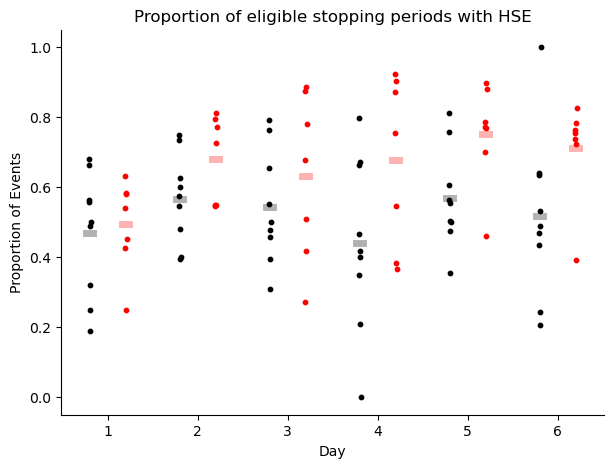

In [9]:
fig, ax = plt.subplots(figsize=[7,5])

lw = 5
s = 10
for day in range(6):
    
    mask = (df['ctrl/cre']=='ctrl') & (df['day']==day) 
    lr = df['tot_prop_sig_events'].loc[mask]._values
    ax.scatter(5*day -1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='black', s=s)
    ax.plot(5*day -1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='black', linewidth=lw,alpha = .3)
    
    mask = (df['ctrl/cre']=='cre') & (df['day']==day) 
    lr = df['tot_prop_sig_events'].loc[mask]._values
    ax.scatter(5*day +1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='red', s=s)
    ax.plot(5*day + 1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='red', linewidth=lw,alpha = .3)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_xticks(np.arange(0,6*5,5))
ax.set_xticklabels([x for x in range(1,7)])

ax.set_xlabel('Day')
ax.set_ylabel('Proportion of Events')

ax.set_title('Proportion of eligible stopping periods with HSE')

fig.savefig(os.path.join(figdir, 'prop_periods_w_hse.pdf'))


In [10]:
aov = mixed_anova(data=df, dv='nov_prop_sig_events', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source        SS  DF1  DF2        MS         F     p-unc       np2  \
0     ctrl/cre  0.582232    1   14  0.582232  2.836896  0.114276  0.168493   
1          day  0.618143    5   70  0.123629  2.130488  0.071797  0.132078   
2  Interaction  0.585909    5   70  0.117182  2.019393  0.086418  0.126059   

        eps  
0       NaN  
1  0.710569  
2       NaN  


In [11]:
aov = mixed_anova(data=df, dv='fam_prop_sig_events', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source        SS  DF1  DF2        MS         F     p-unc  p-GG-corr  \
0     ctrl/cre  0.523475    1   14  0.523475  4.843332  0.045036        NaN   
1          day  0.259983    5   70  0.051997  2.131590  0.071665   0.111162   
2  Interaction  0.153992    5   70  0.030798  1.262568  0.289864        NaN   

        np2       eps sphericity   W-spher   p-spher  
0  0.257032       NaN        NaN       NaN       NaN  
1  0.132138  0.625774      False  0.128888  0.021966  
2  0.082723       NaN        NaN       NaN       NaN  


/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/pingouin/parametric.py:1568: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  aov = pd.concat([aov_betw.drop(1), aov_with.drop(1)], axis=0, sort=False, ignore_index=True)


# Proportion of population that participates aka size of events

In [12]:
df = {'ctrl/cre':[], 'day':[], 'mouse': [], 'm': [], 'nov_prop_sig_events':[], 'fam_prop_sig_events': [], 'tot_prop_sig_events':[]}
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    for day in range(6):
        for m, mouse in enumerate(mice):
            with open(hse_dict[cond_key][day][mouse], 'rb') as file:
                hse = pickle.load(file)
                
            nov_N, nov_sig_counter = 0, 0
            fam_N, fam_sig_counter = 0, 0
            for start, stop in zip(hse.post_reward_starts, hse.post_reward_ends):
                nov_bool = hse.lr[start]==hse.novel_arm
                if hse.pop_coactivity_th[start:stop].sum()>0:
                    if nov_bool:
                        nov_sig_counter += np.amax(hse.pop_coactivity_boxcar[start:stop])/hse.spks.shape[0]
                        nov_N += 1
                        

                    else:
                        fam_sig_counter += np.amax(hse.pop_coactivity_boxcar[start:stop])/hse.spks.shape[0]
                        fam_N += 1
                        
                    
            nov_N, fam_N = np.maximum(nov_N, 1E-5), np.maximum(fam_N, 1E-5)
                    
            df['ctrl/cre'].append(cond_key)
            df['day'].append(day)
            df['mouse'].append(mouse)
            df['m'].append(m)
            df['nov_prop_sig_events'].append(float(nov_sig_counter)/nov_N)
            df['fam_prop_sig_events'].append(float(fam_sig_counter)/fam_N)
            df['tot_prop_sig_events'].append(float(nov_sig_counter+fam_sig_counter)/(nov_N + fam_N))
df = pd.DataFrame(df)
                    

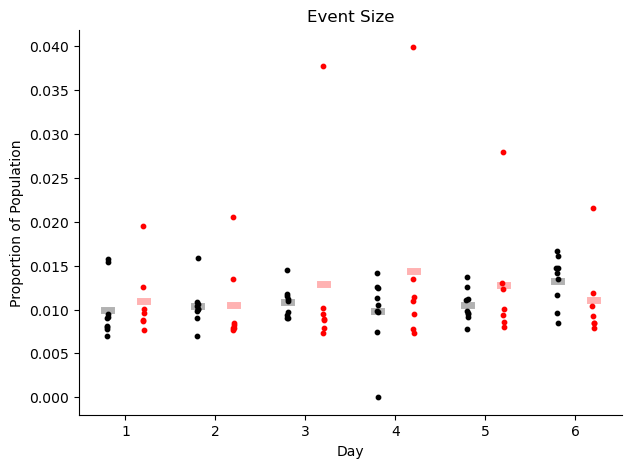

In [13]:
fig, ax = plt.subplots(figsize=[7,5])

lw = 5
s = 10
for day in range(6):
    
    mask = (df['ctrl/cre']=='ctrl') & (df['day']==day) 
    lr = df['tot_prop_sig_events'].loc[mask]._values
    ax.scatter(5*day -1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='black', s=s)
    ax.plot(5*day -1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='black', linewidth=lw,alpha = .3)
    
    mask = (df['ctrl/cre']=='cre') & (df['day']==day) 
    lr = df['tot_prop_sig_events'].loc[mask]._values
    ax.scatter(5*day +1 + np.linspace(-0.05, 0.05, num=lr.shape[0]), lr, color='red', s=s)
    ax.plot(5*day + 1 + np.array([-0.2, .2]), lr.mean()*np.ones([2,]), color='red', linewidth=lw,alpha = .3)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_xticks(np.arange(0,6*5,5))
ax.set_xticklabels([x for x in range(1,7)])

ax.set_xlabel('Day')
ax.set_ylabel('Proportion of Population')

ax.set_title('Event Size')

fig.savefig(os.path.join(figdir, 'event_size_all.pdf'))


# Example Events

In [9]:
cond_key = 'ctrl'
mouse = ctrl_mice[0]
day = 2

# cond_key = 'cre'
# mouse = ko_mice[6]
# day = 1
# hse = HSE(u.load_single_day(mouse,day))
with open(hse_dict[cond_key][day][mouse], 'rb') as file:
    hse = pickle.load(file)

0.08567828643427133


Text(0.5, 0.98, '4467331.1, 2')

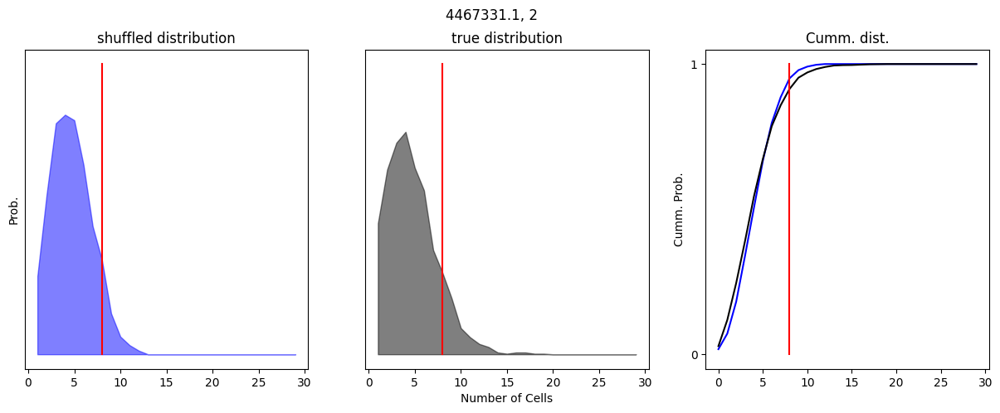

In [10]:
fig, ax = plt.subplots(1,3, figsize=[15,5])

shuff_res = hse.shuff_results.sum(axis=0)
shuff_res = shuff_res/shuff_res.sum()
ax[0].fill_between(hse.bin_edges[1:30], shuff_res[1:30], color='blue', alpha=.5)
ax[0].plot(hse.coactivity_thresh*np.array([1,1]), [0,.2], color='red')

pop_counts,_ = np.histogram(hse.pop_coactivity_boxcar[hse.post_reward_bool>0],hse.bin_edges)
pop_counts = pop_counts/pop_counts.sum()

c = {'ctrl':'black', 'cre':'red'}[cond_key]
ax[1].fill_between(hse.bin_edges[1:30], pop_counts[1:30], color=c, alpha=.5)
ax[1].plot(hse.coactivity_thresh*np.array([1,1]), [0,.2], color='red')

x = np.arange(30)
ax[2].plot(x, np.cumsum(shuff_res[:30]), color='blue')
ax[2].plot(x, np.cumsum(pop_counts[:30]), color=c)
ax[2].plot(hse.coactivity_thresh*np.array([1,1]), [0,1], color='red')
thresh_bin = np.argwhere(hse.bin_edges>hse.coactivity_thresh).ravel()[0]
print(pop_counts[thresh_bin:].sum())
# ax[2].plot(x,)



ax[0].set_yticks([])
ax[1].set_yticks([])
ax[2].set_yticks([0,1])

ax[0].set_title('shuffled distribution')
ax[1].set_title('true distribution')
ax[2].set_title('Cumm. dist.')
ax[0].set_ylabel('Prob.')
ax[2].set_ylabel('Cumm. Prob.')

ax[1].set_xlabel('Number of Cells')
fig.suptitle(f'{mouse}, {day}')

In [11]:

def plot_single_trial_replay(hse, t):

    


    start, stop = hse.trial_start_inds[t], hse.teleport_inds[t]
    post_reward_bool = hse.post_reward_bool[start:stop]
    pop_coactivity_th = hse.pop_coactivity_th[start:stop]
    
    if post_reward_bool.sum()>0 and pop_coactivity_th.sum()>0:
        nov_sort = np.argsort(np.amax(np.nanmean(hse.trial_mat[hse.trial_info['LR']==hse.novel_arm,:,:],axis=0),axis=0))
        fam_sort = np.argsort(np.amax(np.nanmean(hse.trial_mat[hse.trial_info['LR']==-1*hse.novel_arm,:,:],axis=0),axis=0))
        # print(sort.shape)


        nov = hse.trial_info['LR'][t] == hse.novel_arm

        if nov:
            sort = nov_sort
        else:
            sort = fam_sort


        post_reward_coactive_mask = hse.post_reward_coactive_mask[sort,:]

        spks = hse.spks[sort,:]
        spks_th = hse.spks_th[sort,:]

        cell_mask = post_reward_coactive_mask[:, start:stop].sum(axis=-1)>0

        fig = plt.figure(figsize=[5,5])
        gs = fig.add_gridspec(3,1, height_ratios = (3, 1, 1))
        # fig,ax = plt.subplots(3,1, sharex=True)

        hm_ax = fig.add_subplot(gs[0, 0])
        hm_ax.set_title(f'trial {t}, Novel = {nov}')
        x = np.arange(stop-start)


        hm_ax.imshow(spks[cell_mask, :][:,start:stop]/np.nanpercentile(spks[cell_mask,:],99, axis=-1, keepdims=True), 
                     aspect = 'auto', cmap='Greys', interpolation='none', vmin=.0, vmax=.5)




        
        ledges = np.argwhere(post_reward_bool[1:]>post_reward_bool[:-1])
        redges = np.argwhere(post_reward_bool[1:]<post_reward_bool[:-1])
        for ledge, redge in zip(ledges, redges):
            hm_ax.fill_betweenx([-.5,cell_mask.sum()-.5], ledge, redge+1, alpha = .3,  color='green')
        hm_ax.set_ylim([cell_mask.sum()-.5, -.5])
        hm_ax.set_yticks([])
        hm_ax.set_ylabel('Cells')

        speed_ax = fig.add_subplot(gs[1,0], sharex=hm_ax)
        
        
        speed_ax.set_ylabel('Speed')
        speed = sp.ndimage.gaussian_filter1d(hse.speed.ravel()[start:stop], 1)
        speed_ax.plot(x,speed)
        reward_ind = x[hse.reward.ravel()[start:stop]>0]
        if reward_ind.shape[0]==1:
            speed_ax.scatter(reward_ind,speed[reward_ind[0]],color='orange', zorder=10)
        elif reward_ind.shape[0]>1:
            speed_ax.scatter(reward_ind[0],speed[reward_ind[0]],color='orange', zorder=10)
            
        speed_bounds = [np.amin(speed)-5, np.amax(speed)+5]
        for ledge, redge in zip(ledges, redges):
            speed_ax.fill_betweenx(speed_bounds, ledge, redge+1, alpha = .3, zorder=-1, color='green')
        speed_ax.set_ylim(speed_bounds)

        pop_ax = fig.add_subplot(gs[2,0], sharex=hm_ax)
        
        for ledge, redge in zip(ledges, redges):
            pop_ax.fill_betweenx([-1,np.amax(hse.pop_coactivity_boxcar[start:stop])+2], ledge, redge+1, alpha = .3, zorder=-1, color='green')
        
        pop_ax.set_ylim([-1,np.amax(hse.pop_coactivity_boxcar[start:stop])+2])
        pop_ax.plot(hse.pop_coactivity_boxcar[start:stop], color='black')
        
        pop_ax.plot(np.arange(stop-start),hse.coactivity_thresh*np.ones([stop-start,]), color='red', alpha=.3)
        pop_ax.set_ylabel('Pop Activity')


        time = x/hse.frame_rate
        time = [str(int(t)) for t in time]
        pop_ax.set_xticks(x[::50], labels=time[::50])

        return fig
    else:
        # print(f"No eligible stopping period on trial {t}")
        return None
    

/tmp/ipykernel_50570/1091106235.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=[5,5])


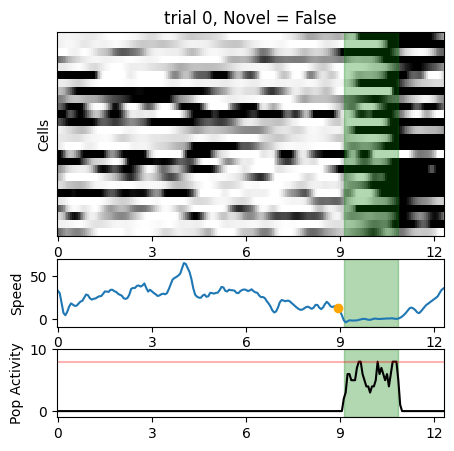

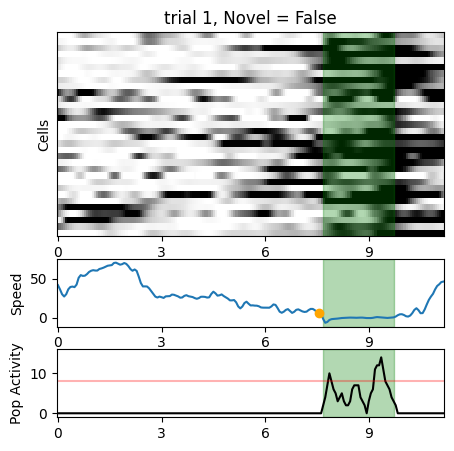

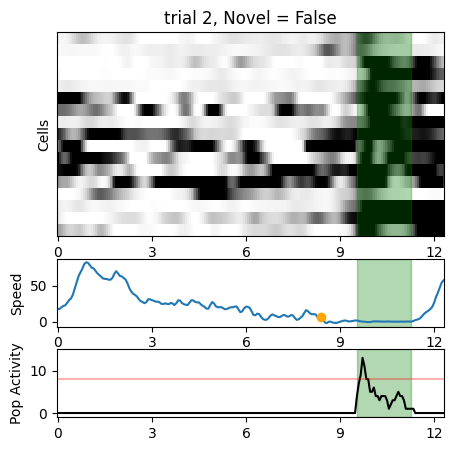

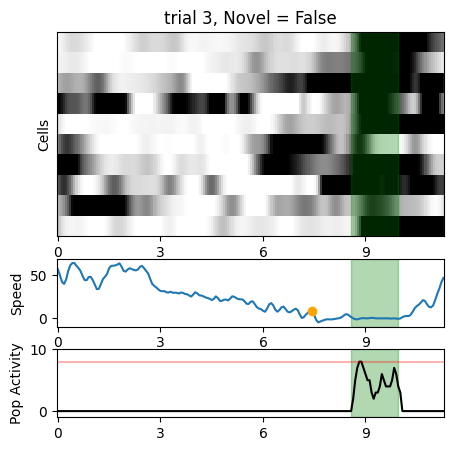

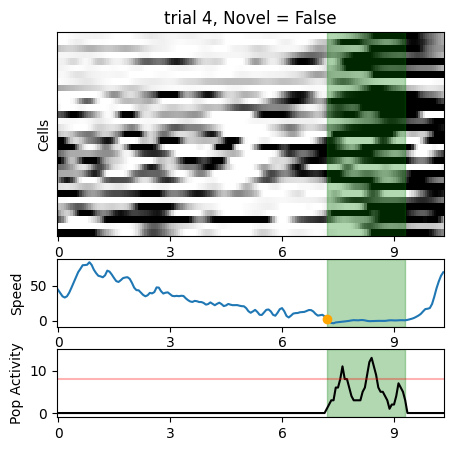

...

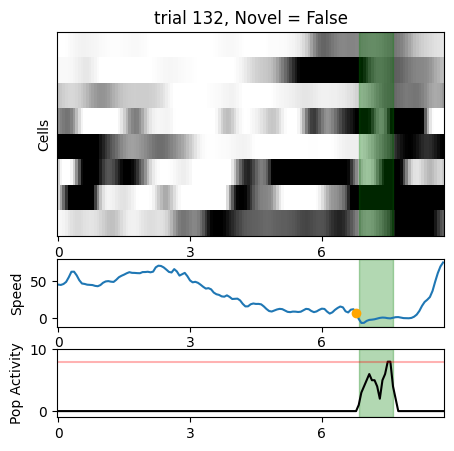

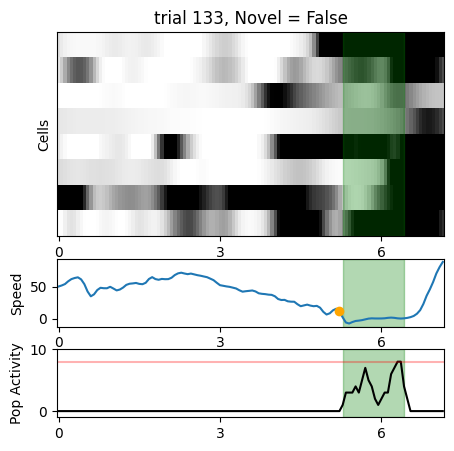

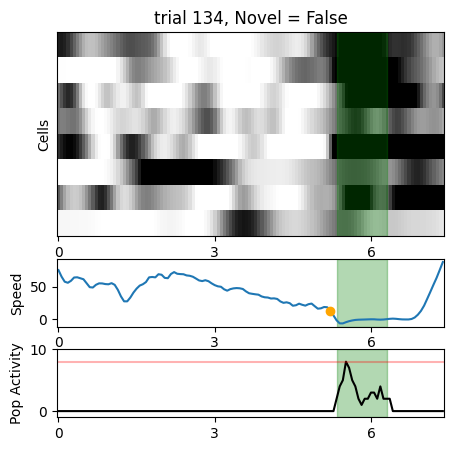

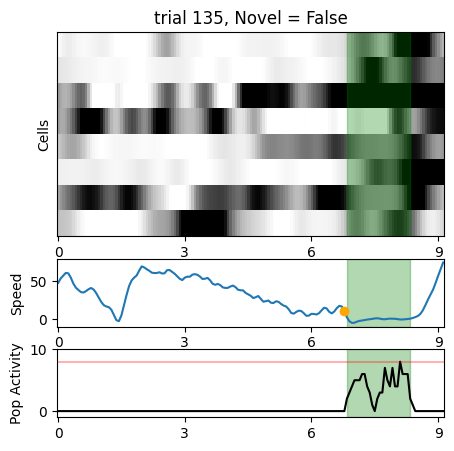

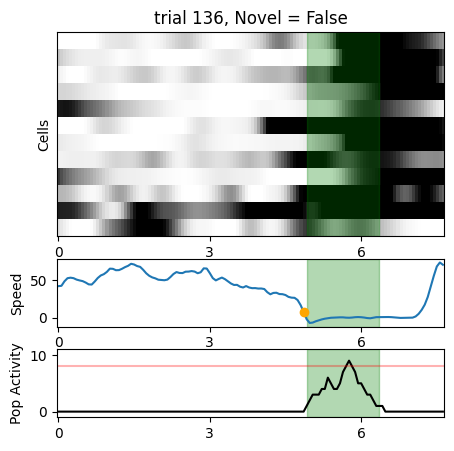

In [12]:
for trial in range(hse.trial_mat.shape[0]):
    fig = plot_single_trial_replay(hse, trial)

In [13]:
mouse

'4467331.1'

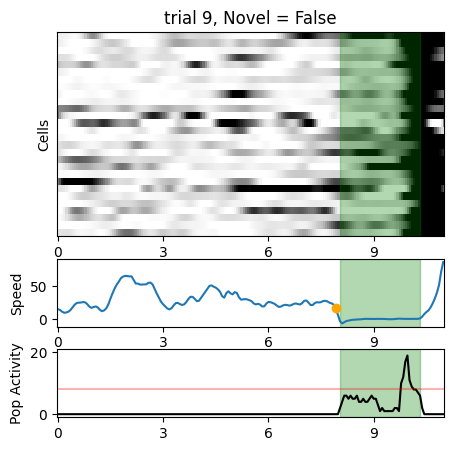

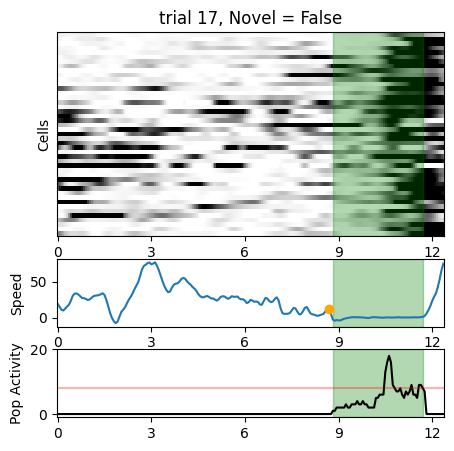

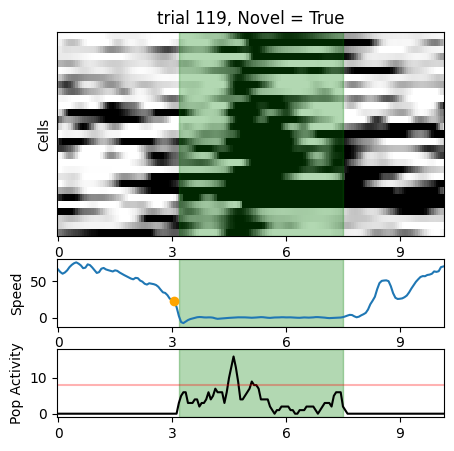

In [14]:
#  ctrl_0 , 0 - [14, 25, 64, 69, 84, 87, 98, 103, 104, 110, 111, 124]
#  ctrl_0 , 2 - [9, 17, 119]
# ctrl_mice[6], 1 - 82, 103
# ctrl_mice[7],1  - 88
#  cre_0, 2 - 
119
savedir = os.path.join(figdir, mouse, f'day_{day}')
os.makedirs(savedir, exist_ok=True)
for trial in [9, 17, 119]:
    fig = plot_single_trial_replay(hse, trial)
    fig.savefig(os.path.join(savedir, f'trial_{trial}.pdf'))

In [18]:
hse.post_reward_coactive_mask.shape

(1381, 34310)

# Proportion of distribution greater than chance

In [207]:
df = {'ctrl/cre':[], 'day':[], 'mouse': [], 'm': [], 
      'tail_weight':[]}


for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    for day in range(6):
        for m, mouse in enumerate(mice):
            with open(hse_dict[cond_key][day][mouse], 'rb') as file:
                hse = pickle.load(file)
                
                if hse.post_reward_epochs.shape[0]>0:
                    thresh_bin = np.argwhere(hse.bin_edges>hse.coactivity_thresh).ravel()[0]
                    pop_counts,_ = np.histogram(hse.pop_coactivity_boxcar[hse.post_reward_bool>0],hse.bin_edges)
                    pop_counts = pop_counts/pop_counts.sum()
                    tail_weight = pop_counts[thresh_bin:].sum()
                    
                    df['ctrl/cre'].append(cond_key)
                    df['day'].append(day)
                    df['mouse'].append(mouse)
                    df['m'].append(m)
                    df['tail_weight'].append(tail_weight)
                    
df = pd.DataFrame(df)

                    


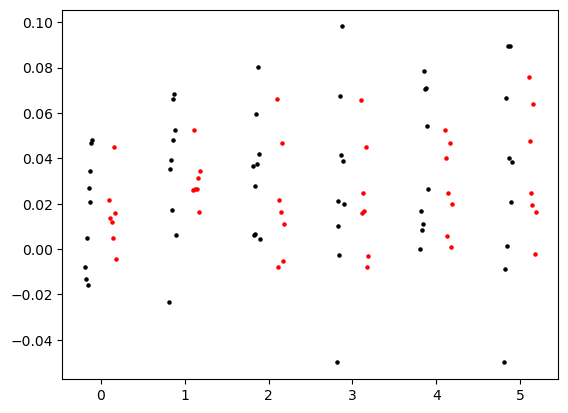

In [209]:
fig, ax = plt.subplots()

mask = df['ctrl/cre']=='ctrl'
_df = df[mask]
x = _df['day'] - _df['m']/len(ctrl_mice)*.1 - .1
ax.scatter(x, _df['tail_weight']-.05, color='black', s=5)

mask = df['ctrl/cre']=='cre'
_df = df[mask]
x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
ax.scatter(x, _df['tail_weight']-.05, color='red', s=5)

# Frequency and duration of events
## fam v novel

# Proportion of population that participates in HSE
## fam v novel

# Proportion of events that each cell participates in
## fam v novel

# Activity rate of reactivated cells vs not 

In [12]:

df = {'ctrl/cre':[], 'day':[], 'mouse': [], 'm': [], 
      'nov_activated':[], 'nov_activated_histcounts': [],
      'nov_nonactivated':[], 'nov_nonactivated_histcounts': [],
      'fam_activated':[], 'fam_activated_histcounts': [],
      'fam_nonactivated':[], 'fam_nonactivated_histcounts': [],
      'nov_diff':[], 'fam_diff':[]}

edges = np.linspace(0,1,num=50)
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    for day in range(6):
        for m, mouse in enumerate(mice):
            with open(hse_dict[cond_key][day][mouse], 'rb') as file:
                hse = pickle.load(file)
                
                if hse.post_reward_epochs.shape[0]>0:
                
                    nov_cell_mask = hse.post_reward_coactive_mask[:,hse.lr==hse.novel_arm].sum(axis=-1)>0
                    nov_trial_mask = hse.trial_info['LR']==hse.novel_arm
                    nov_spks = hse.trial_mat[nov_trial_mask, :, :]
                    nov_activated = np.nanmean(np.nanmean(nov_spks[:, :, nov_cell_mask], axis=0), axis=0)
                    nov_nonactivated = np.nanmean(np.nanmean(nov_spks[:, :, ~nov_cell_mask], axis=0), axis=0)

                    fam_cell_mask = hse.post_reward_coactive_mask[:,hse.lr==-1*hse.novel_arm].sum(axis=-1)>0
                    fam_trial_mask = hse.trial_info['LR']==-1*hse.novel_arm
                    fam_spks = hse.trial_mat[fam_trial_mask, :, :]
                    fam_activated = np.nanmean(np.nanmean(fam_spks[:, :, fam_cell_mask], axis=0), axis=0)
                    fam_nonactivated = np.nanmean(np.nanmean(fam_spks[:, :, ~fam_cell_mask], axis=0), axis=0)

                    df['ctrl/cre'].append(cond_key)
                    df['day'].append(day)
                    df['mouse'].append(mouse)
                    df['m'].append(m)

                    df['nov_activated'].append(nov_activated.mean())
                    df['nov_activated_histcounts'].append(np.histogram(nov_activated,edges)[0])

                    df['nov_nonactivated'].append(nov_nonactivated.mean())
                    df['nov_nonactivated_histcounts'].append(np.histogram(nov_nonactivated,edges)[0])

                    df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())

                    df['fam_activated'].append(fam_activated.mean())
                    df['fam_activated_histcounts'].append(np.histogram(fam_activated,edges)[0])

                    df['fam_nonactivated'].append(fam_nonactivated.mean())
                    df['fam_nonactivated_histcounts'].append(np.histogram(fam_nonactivated,edges)[0])

                    df['fam_diff'].append(fam_activated.mean() - fam_nonactivated.mean())

df = pd.DataFrame(df)


/tmp/ipykernel_42819/2323905279.py:34: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2323905279.py:40: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())
/tmp/ipykernel_42819/2323905279.py:34: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2323905279.py:40: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())
/tmp/ipykernel_42819/2323905279.py:34: RuntimeWarning: Mean of empty slice.
  

In [13]:
df.to_pickle(f'{basedir}/activity_rate_df.pkl')

In [14]:
df = pd.read_pickle(f'{basedir}/activity_rate_df.pkl')

controls
Day 0
familiar t=-9.481599805029097 p=0.000690377380170293
novel t=1.156505348033677 p=0.3118412486296869
Day 1
familiar t=-2.648080209989122 p=0.03303362156781072
novel t=3.2940730263156097 p=0.01322815487775674
Day 2
familiar t=-1.4670887096732628 p=0.19272005875882683
novel t=3.788461848044565 p=0.009089747798824595
Day 3
familiar t=-5.800564318629257 p=0.002146497878701375
novel t=2.588514566920199 p=0.048924777734652265
Day 4
familiar t=-2.992165468362567 p=0.020164437154464927
novel t=2.8892477150026994 p=0.02334130256699429
Day 5
familiar t=1.2034315609271762 p=0.26792413003608473
novel t=1.5326366753866925 p=0.1692295330687194
cre
Day 0
familiar t=-1.9794258224020729 p=0.11887967827479197
novel t=1.7037669273673368 p=0.16363110292124888
Day 1
familiar t=-1.878171853707703 p=0.11915612607632763
novel t=1.6049841840461292 p=0.16940397125092063
Day 2
familiar t=-6.96447449509639 p=0.00043533072963266965
novel t=1.0123248101986306 p=0.35045116593951514
Day 3
familiar t=-1.

Text(0, 0.5, 'Firing Rate (replayed - non-replayed)')

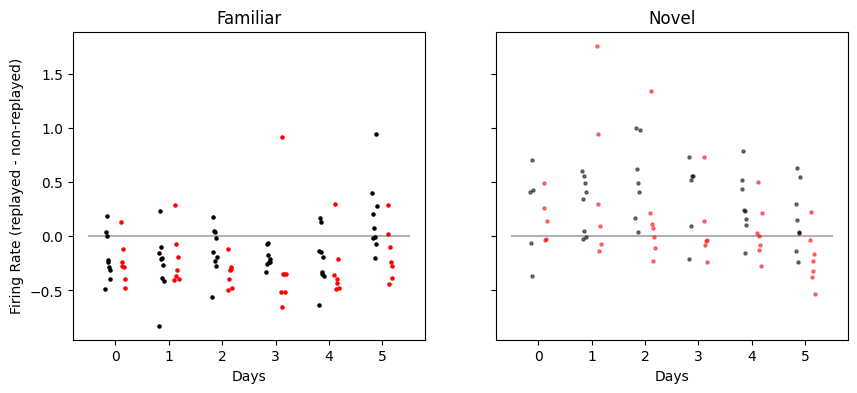

In [15]:
fig, ax = plt.subplots(1,2, figsize=[10,4], sharey=True)

mask = df['ctrl/cre']=='ctrl'
_df = df[mask]
x = _df['day'] - _df['m']/len(ctrl_mice)*.1 - .1
ax[0].scatter(x, 15.46*_df['fam_diff'], color='black', s=5)
ax[1].scatter(x, 15.46*_df['nov_diff'], color='black', s=5, alpha=.5)

print("controls")
for day in range(6):
    _df = df[mask*(df['day']==day)*(~np.isnan(df['nov_diff'].to_numpy()))]
    # print(_df)
    
    t,p = sp.stats.ttest_1samp(_df['fam_diff'],0)
    print(f'Day {day}')
    print(f'familiar t={t} p={p}')
    t,p = sp.stats.ttest_1samp(_df['nov_diff'],0)
    print(f'novel t={t} p={p}')

mask = df['ctrl/cre']=='cre'
_df = df[mask]
x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
ax[0].scatter(x, 15.46*_df['fam_diff'], color='red', s=5)
ax[1].scatter(x, 15.46*_df['nov_diff'], color='red', s=5, alpha=.5)

print("cre")
for day in range(6):
    _df = df[mask*(df['day']==day)*(~np.isnan(df['nov_diff'].to_numpy()))]
    # print(_df)
    
    t,p = sp.stats.ttest_1samp(_df['fam_diff'],0)
    print(f'Day {day}')
    print(f'familiar t={t} p={p}')
    t,p = sp.stats.ttest_1samp(_df['nov_diff'],0)
    print(f'novel t={t} p={p}')

ax[0].plot([-.5,5.5], [0,0], color='black', alpha=.3, zorder=-1)
ax[1].plot([-.5,5.5], [0,0], color='black', alpha=.3, zorder=-1)

ax[0].set_title('Familiar')
ax[1].set_title('Novel')

ax[0].set_xlabel('Days')
ax[1].set_xlabel('Days')

ax[0].set_ylabel('Firing Rate (replayed - non-replayed)')

# mask = df['ctrl/cre']=='cre'
# _df = df[mask]
# x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
# ax.scatter(x, _df['tot_prop_sig_events'], color='red', s=5)

In [25]:
aov = mixed_anova(data=df, dv='nov_diff', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source            SS  DF1  DF2            MS         F     p-unc  \
0     ctrl/cre  3.747496e-07    1    8  3.747496e-07  0.100451  0.759402   
1          day  1.055617e-05    5   40  2.111233e-06  2.396331  0.054241   
2  Interaction  4.552490e-06    5   40  9.104980e-07  1.033450  0.411315   

        np2       eps  
0  0.012401       NaN  
1  0.230498  0.293909  
2  0.114403       NaN  


/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/pingouin/distribution.py:1006: RuntimeWarning: divide by zero encountered in scalar divide
  W = np.product(eig) / (eig.sum() / d) ** d


In [26]:
aov = mixed_anova(data=df, dv='fam_diff', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source            SS  DF1  DF2            MS         F     p-unc  \
0     ctrl/cre  1.990625e-07    1   13  1.990625e-07  0.249584  0.625717   
1          day  3.295631e-06    5   65  6.591263e-07  2.130540  0.072792   
2  Interaction  1.333405e-06    5   65  2.666810e-07  0.862012  0.511493   

        np2       eps  
0  0.018837       NaN  
1  0.140811  0.515738  
2  0.062185       NaN  


/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/pingouin/distribution.py:1006: RuntimeWarning: divide by zero encountered in scalar divide
  W = np.product(eig) / (eig.sum() / d) ** d


# Trial x trial correlation of reactivated vs not

In [16]:
df = {'ctrl/cre':[], 'day':[], 'mouse': [], 'm': [], 
      'nov_activated':[], 'nov_activated_histcounts': [],
      'nov_nonactivated':[], 'nov_nonactivated_histcounts': [],
      'fam_activated':[], 'fam_activated_histcounts': [],
      'fam_nonactivated':[], 'fam_nonactivated_histcounts': [],
      'nov_diff':[], 'fam_diff':[]}

edges = np.linspace(0,1,num=50)
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    for day in range(6):
        for m, mouse in enumerate(mice):
            print(mouse,day)
            with open(hse_dict[cond_key][day][mouse], 'rb') as file:
                hse = pickle.load(file)
            
            if hse.post_reward_epochs.shape[0]>0:
                tt_corr_mat = sp.stats.zscore(hse.trial_mat, axis=1, nan_policy='omit')
                tt_corr_mat[np.isnan(tt_corr_mat)]=0
                tt_corr_mat = 1/(hse.trial_mat.shape[1]-1)*np.matmul(np.transpose(tt_corr_mat, axes=(2, 0, 1)), np.transpose(tt_corr_mat, axes=(2, 1, 0)))

                for cell in range(tt_corr_mat.shape[0]):
                    _mat = tt_corr_mat[cell,:, :]
                    _mat[np.diag_indices_from(_mat)]=np.nan
                    tt_corr_mat[cell, :, :] = _mat
                # tt_corr_mat[:,np.diag_indices(tt_corr_mat.shape[1])]=np.nan

                print(tt_corr_mat.shape)

                nov_cell_mask = hse.post_reward_coactive_mask[:,hse.lr==hse.novel_arm].sum(axis=-1)>0
                # nov_cell_mask = hse.post_reward_coactive_mask[:,:].sum(axis=-1)>0
                nov_trial_mask = hse.trial_info['LR']==hse.novel_arm
                nov_activated = np.nanmean(np.nanmean(tt_corr_mat[nov_cell_mask, :, :][:, nov_trial_mask, :][:, :, nov_trial_mask], axis=-1), axis=-1)
                nov_nonactivated = np.nanmean(np.nanmean(tt_corr_mat[~nov_cell_mask, :, :][:, nov_trial_mask, :][:, :, nov_trial_mask], axis=-1), axis=-1)

                fam_cell_mask = hse.post_reward_coactive_mask[:,hse.lr==-1*hse.novel_arm].sum(axis=-1)>0
                # fam_cell_mask = hse.post_reward_coactive_mask[:,:].sum(axis=-1)>0
                fam_trial_mask = hse.trial_info['LR']==-1*hse.novel_arm
                fam_activated = np.nanmean(np.nanmean(tt_corr_mat[fam_cell_mask, :, :][:, fam_trial_mask, :][:, :, fam_trial_mask], axis=-1), axis=-1)
                fam_nonactivated = np.nanmean(np.nanmean(tt_corr_mat[~fam_cell_mask, :, :][:, fam_trial_mask, :][:, :, fam_trial_mask], axis=-1), axis=-1)

                df['ctrl/cre'].append(cond_key)
                df['day'].append(day)
                df['mouse'].append(mouse)
                df['m'].append(m)

                df['nov_activated'].append(nov_activated.mean())
                df['nov_activated_histcounts'].append(np.histogram(nov_activated,edges)[0])

                df['nov_nonactivated'].append(nov_nonactivated.mean())
                df['nov_nonactivated_histcounts'].append(np.histogram(nov_nonactivated,edges)[0])

                df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())

                df['fam_activated'].append(fam_activated.mean())
                df['fam_activated_histcounts'].append(np.histogram(fam_activated,edges)[0])

                df['fam_nonactivated'].append(fam_nonactivated.mean())
                df['fam_nonactivated_histcounts'].append(np.histogram(fam_nonactivated,edges)[0])

                df['fam_diff'].append(fam_activated.mean() - fam_nonactivated.mean())

df = pd.DataFrame(df)

4467331.1 0
(1381, 139, 139)
4467331.2 0
(1283, 140, 140)
4467332.1 0
(1568, 138, 138)
4467332.2 0
(1694, 100, 100)
4467333.1 0
(1554, 140, 140)
mCherry6 0
(1030, 140, 140)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


mCherry7 0
(909, 140, 140)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


mCherry8 0
(639, 140, 140)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


mCherry9 0
(977, 140, 140)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


4467331.1 1
(1093, 140, 140)
4467331.2 1
(1170, 140, 140)
4467332.1 1
(1422, 128, 128)
4467332.2 1
(1036, 136, 136)
4467333.1 1
(1450, 140, 140)
mCherry6 1
(799, 140, 140)
mCherry7 1
(873, 140, 140)
mCherry8 1
(740, 140, 140)
mCherry9 1
(1038, 140, 140)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


4467331.1 2
(972, 140, 140)
4467331.2 2
(1093, 140, 140)
4467332.1 2
(1155, 139, 139)
4467332.2 2
(1537, 140, 140)
4467333.1 2
(1447, 140, 140)
mCherry6 2
(961, 140, 140)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


mCherry7 2
(781, 140, 140)
mCherry8 2
(1030, 140, 140)
mCherry9 2
(996, 140, 140)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


4467331.1 3
(1068, 140, 140)
4467331.2 3
(1048, 140, 140)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


4467332.1 3
(1046, 140, 140)
4467332.2 3
(1684, 140, 140)
4467333.1 3
(1467, 140, 140)
mCherry6 3
(985, 140, 140)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


mCherry7 3
(858, 140, 140)
mCherry8 3
(736, 138, 138)
mCherry9 3
4467331.1 4
(962, 139, 139)
4467331.2 4
(1033, 140, 140)
4467332.1 4
(1208, 140, 140)
4467332.2 4
(1509, 139, 139)
4467333.1 4
(1354, 140, 140)
mCherry6 4
(965, 140, 140)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


mCherry7 4
(820, 140, 140)
mCherry8 4
(808, 140, 140)
mCherry9 4
(896, 140, 140)
4467331.1 5
(1370, 140, 140)
4467331.2 5
(982, 140, 140)
4467332.1 5
(1242, 140, 140)
4467332.2 5
(1586, 139, 139)
4467333.1 5
(1428, 140, 140)
mCherry6 5
(1079, 140, 140)
mCherry7 5
(861, 140, 140)
mCherry8 5
(730, 140, 140)
mCherry9 5
(942, 140, 140)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


4467975.1 0
(904, 124, 124)
4467975.2 0
(288, 139, 139)
4467975.3 0
(936, 102, 102)
4467975.4 0
(1148, 125, 125)
4467975.5 0
(1578, 55, 55)
Cre7 0
(973, 139, 139)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


Cre9 0
(1050, 134, 134)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


4467975.1 1
(520, 124, 124)
4467975.2 1
(441, 124, 124)
4467975.3 1
(1258, 96, 96)
4467975.4 1
(1505, 120, 120)
4467975.5 1
(1554, 64, 64)
Cre7 1
(1051, 127, 127)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


Cre9 1
(1088, 133, 133)
4467975.1 2
(797, 136, 136)
4467975.2 2
(388, 109, 109)
4467975.3 2
(1444, 77, 77)
4467975.4 2
(1346, 122, 122)
4467975.5 2
(1535, 45, 45)
Cre7 2
(1181, 131, 131)
Cre9 2
(1044, 114, 114)
4467975.1 3
(689, 139, 139)
4467975.2 3
(353, 84, 84)
4467975.3 3
(1233, 92, 92)
4467975.4 3
(1389, 136, 136)
4467975.5 3
(1649, 59, 59)
Cre7 3
(935, 136, 136)
Cre9 3
(942, 116, 116)


/tmp/ipykernel_42819/2641302699.py:46: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_42819/2641302699.py:52: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


4467975.1 4
(664, 140, 140)
4467975.2 4
(250, 117, 117)
4467975.3 4
(1087, 93, 93)
4467975.4 4
(1154, 125, 125)
4467975.5 4
(1436, 38, 38)
Cre7 4
(908, 58, 58)
Cre9 4
(995, 64, 64)
4467975.1 5
(771, 139, 139)
4467975.2 5
(333, 133, 133)
4467975.3 5
(1115, 78, 78)
4467975.4 5
(1223, 111, 111)
4467975.5 5
(1840, 74, 74)
Cre7 5
(894, 108, 108)
Cre9 5
(996, 106, 106)


In [17]:
df.to_pickle(f'{basedir}/trial_trial_corr_df.pkl')

In [18]:
edges = np.linspace(0,1,num=50)
df = pd.read_pickle(f'{basedir}/trial_trial_corr_df.pkl')

controls
Day 0
familiar t=1.3499153711226275 p=0.24837581187634114
novel t=1.9802446503548377 p=0.11876834484889118
Day 1
familiar t=2.6484173185826494 p=0.03301745971599308
novel t=4.978564652850073 p=0.0016035815743732631
Day 2
familiar t=0.6513157919562249 p=0.5389726066038691
novel t=2.7637291884489747 p=0.032692372952033644
Day 3
familiar t=3.774775096710233 p=0.012959203619535557
novel t=1.5175283332316531 p=0.1895857345492475
Day 4
familiar t=1.6210833896415398 p=0.1490306850064037
novel t=4.482503672548344 p=0.002857675359220257
Day 5
familiar t=2.0463971355015445 p=0.07995443368247157
novel t=1.1261544464819058 p=0.29722229815655626
cre
Day 0
familiar t=-0.9065368900727128 p=0.4159231099490431
novel t=-0.5220719288154252 p=0.6291972160107697
Day 1
familiar t=-4.427190973636677 p=0.006845959728032097
novel t=1.3125878474765518 p=0.24634005322326266
Day 2
familiar t=-1.978948589034353 p=0.0951625069901186
novel t=1.2045281358927364 p=0.27373877185294443
Day 3
familiar t=-2.39039

Text(0, 0.5, '$\\Delta$ Trial x Trial Corr (replayed - non-replayed)')

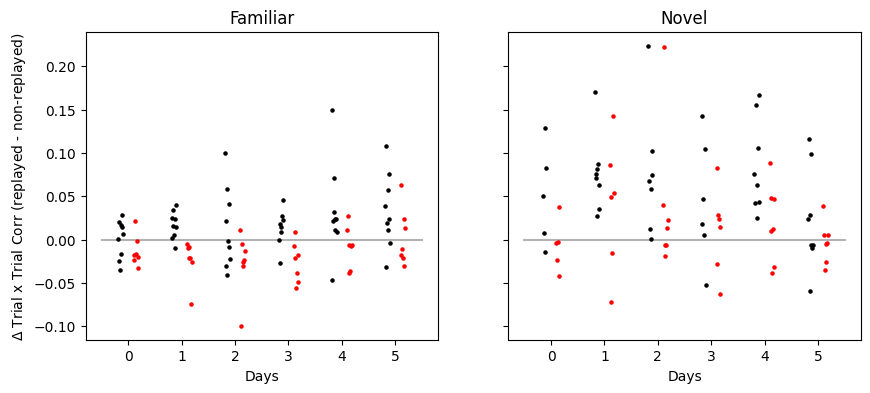

In [19]:
fig, ax = plt.subplots(1,2, figsize=[10,4], sharey=True)

mask = df['ctrl/cre']=='ctrl'
_df = df[mask]
x = _df['day'] - _df['m']/len(ctrl_mice)*.1 - .1
# ax[0].scatter(x, _df['fam_activated'], color='black', s=5)
# ax[1].scatter(x, _df['nov_activated'], color='black', s=5)
ax[0].scatter(x, _df['fam_diff'], color='black', s=5)
ax[1].scatter(x, _df['nov_diff'], color='black', s=5)

print("controls")
for day in range(6):
    _df = df[mask*(df['day']==day)*(~np.isnan(df['nov_diff'].to_numpy()))]
    # print(_df)
    
    t,p = sp.stats.ttest_1samp(_df['fam_diff'],0)
    print(f'Day {day}')
    print(f'familiar t={t} p={p}')
    t,p = sp.stats.ttest_1samp(_df['nov_diff'],0)
    print(f'novel t={t} p={p}')

mask = df['ctrl/cre']=='cre'
_df = df[mask]
x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
# ax[0].scatter(x, _df['fam_activated'], color='red', s=5)
# ax[1].scatter(x, _df['nov_activated'], color='red', s=5)
ax[0].scatter(x, _df['fam_diff'], color='red', s=5)
ax[1].scatter(x, _df['nov_diff'], color='red', s=5)

print("cre")
for day in range(6):
    _df = df[mask*(df['day']==day)*(~np.isnan(df['nov_diff'].to_numpy()))]
    # print(_df)
    
    t,p = sp.stats.ttest_1samp(_df['fam_diff'],0)
    print(f'Day {day}')
    print(f'familiar t={t} p={p}')
    t,p = sp.stats.ttest_1samp(_df['nov_diff'],0)
    print(f'novel t={t} p={p}')
    
ax[0].plot([-.5,5.5], [0, 0], color='black', alpha=.3, zorder=-1)
ax[1].plot([-.5,5.5], [0, 0], color='black', alpha=.3, zorder=-1)


ax[0].set_title('Familiar')
ax[1].set_title('Novel')

ax[0].set_xlabel('Days')
ax[1].set_xlabel('Days')

ax[0].set_ylabel(r'$\Delta$ Trial x Trial Corr (replayed - non-replayed)')


In [20]:
df.head()

,ctrl/cre,day,mouse,m,nov_activated,nov_activated_histcounts,nov_nonactivated,nov_nonactivated_histcounts,fam_activated,fam_activated_histcounts,fam_nonactivated,fam_nonactivated_histcounts,nov_diff,fam_diff
0,ctrl,0,4467331.1,0,0.339918,"[2, 5, 7, 5, 3, 4, 0, 4, 3, 1, 2, 3, 1, 2, 3, ...",0.257898,"[68, 92, 88, 70, 75, 55, 47, 58, 46, 43, 38, 3...",0.226763,"[10, 15, 10, 16, 15, 20, 12, 22, 11, 19, 9, 9,...",0.220274,"[49, 100, 87, 89, 80, 82, 48, 55, 35, 37, 41, ...",0.082020,0.006489
1,ctrl,0,4467331.2,1,0.130784,"[8, 2, 6, 5, 5, 6, 4, 2, 0, 3, 2, 2, 0, 1, 1, ...",0.145308,"[122, 126, 110, 86, 85, 93, 82, 50, 51, 43, 37...",0.126551,"[22, 37, 40, 49, 39, 32, 25, 18, 14, 7, 11, 8,...",0.111637,"[92, 133, 135, 123, 85, 54, 51, 46, 35, 30, 25...",-0.014524,0.014914
2,ctrl,0,4467332.1,2,0.280240,"[2, 2, 2, 3, 3, 3, 2, 0, 3, 3, 4, 1, 1, 2, 2, ...",0.151052,"[116, 158, 140, 140, 111, 90, 103, 67, 68, 42,...",0.162692,"[12, 26, 24, 32, 39, 24, 28, 23, 15, 30, 19, 5...",0.134307,"[59, 158, 130, 135, 113, 106, 81, 67, 66, 45, ...",0.129188,0.028385
3,ctrl,0,4467332.2,3,0.103168,"[11, 7, 11, 15, 9, 7, 6, 3, 3, 4, 2, 2, 0, 3, ...",0.095171,"[206, 215, 172, 169, 140, 95, 80, 73, 45, 58, ...",0.129123,"[18, 36, 25, 30, 26, 25, 22, 16, 12, 6, 10, 6,...",0.145332,"[96, 182, 151, 144, 124, 97, 79, 84, 60, 41, 4...",0.007997,-0.016209
4,ctrl,0,4467333.1,4,0.222721,"[5, 15, 10, 8, 5, 7, 7, 5, 10, 4, 6, 4, 5, 0, ...",0.172848,"[109, 102, 139, 93, 74, 95, 79, 77, 62, 47, 36...",0.175270,"[16, 10, 21, 17, 21, 21, 13, 11, 7, 9, 14, 9, ...",0.158685,"[114, 156, 127, 115, 101, 95, 65, 72, 53, 53, ...",0.049874,0.016585


In [21]:
aov = mixed_anova(data=df[df['day']<5], dv='nov_diff', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source        SS  DF1  DF2        MS         F     p-unc       np2  \
0     ctrl/cre  0.011259    1    7  0.011259  1.785054  0.223328  0.203192   
1          day  0.006326    4   28  0.001582  0.541347  0.706637  0.071784   
2  Interaction  0.012462    4   28  0.003116  1.066415  0.391580  0.132204   

        eps  
0       NaN  
1  0.699993  
2       NaN  


In [22]:
aov = mixed_anova(data=df[df['day']<5], dv='fam_diff', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source        SS  DF1  DF2        MS          F     p-unc       np2  \
0     ctrl/cre  0.016259    1   13  0.016259  11.389892  0.004977  0.466992   
1          day  0.002297    4   52  0.000574   1.155880  0.340989  0.081654   
2  Interaction  0.001671    4   52  0.000418   0.840968  0.505563  0.060759   

        eps  
0       NaN  
1  0.789815  
2       NaN  


/home/mplitt/mambaforge/envs/stx3/lib/python3.10/site-packages/pingouin/distribution.py:1004: RuntimeWarning: divide by zero encountered in scalar divide
  W = np.prod(eig) / (eig.sum() / d) ** d


# correlation across days

In [15]:
def get_cell_orders(mouse, session_deets, days, match_inds):
    if mouse in ctrl_mice:
        cond_key='ctrl'
    else:
        cond_key='cre'
            
    
    cell_order = []
    for day in days:
        deets = session_deets[day]
        if isinstance(deets,tuple):
            roi_inds = []
            for _deets in deets:
                roi_inds.append(_deets['ravel_ind'])
            print(roi_inds)
            mapping = u.common_rois(match_inds, roi_inds)
            
            # print(common_roi_mapping.shape)
            cell_order.append(mapping[0,:].tolist())
        else:
            # with open(hse_dict[cond_key][day][mouse], 'rb') as file:
            #     hse = pickle.load(file)
            cell_order.append([])
    return cell_order

def common_rois_adjust(mouse, days):
    if mouse in ctrl_mice:
        session_deets = stx.ymaze_sess_deets.CTRL_sessions[mouse]
    else:
        session_deets = stx.ymaze_sess_deets.KO_sessions[mouse]
    
    
    ravel_inds = []
    day_inds = []
    for day in days:
        deets = session_deets[day]
        if isinstance(deets, tuple):
            for _deets in deets:
                ravel_inds.append(_deets['ravel_ind'])
                day_inds.append(day)
        else:
            ravel_inds.append(deets['ravel_ind'])
            day_inds.append(day)

    pkldir = os.path.join('/home/mplitt/YMazeSessPkls/', mouse)
    with open(os.path.join(pkldir, "roi_aligner_results.pkl"), 'rb') as file:
        match_inds = dill.load(file)
    # print(match_inds.keys(), ravel_inds)
    

    common_roi_mapping = u.common_rois(match_inds, ravel_inds)

    c_rows = []
    for i, d in enumerate(day_inds):
        if d != day_inds[i-1]:
            c_rows.append(i)
    
    # print(c_rows)
    common_roi_mapping = common_roi_mapping[c_rows,:]
    cell_order = get_cell_orders(mouse,session_deets, days, match_inds)

    roi_mapping_adj = np.zeros(common_roi_mapping.shape)
    c_cols = []
    for row, order in enumerate(cell_order):
        croi = common_roi_mapping[row,:]

        if len(order)==0:
            roi_mapping_adj[row,:] = croi
        else:
            # print(len(order), common_roi_mapping.shape)
            for col, _c in enumerate(croi):
                match = np.argwhere(order==_c)
                if len(match)>0:
                    c_cols.append(col)
                    roi_mapping_adj[row,col]=match[0][0]
                    # print(_c, match[0][0])
                    
    if len(c_cols) !=0:
        roi_mapping_adj = roi_mapping_adj[:,c_cols]
    return roi_mapping_adj.astype(int)


In [16]:
def predict_future_tt_stability(mouse):
    print(mouse)
    if mouse in ctrl_mice:
        cond_key='ctrl'
    else:
        cond_key='cre'
    corr_dict = {}
    for react_day in range(6):
        corr_dict[react_day] = {}
        for tt_corr_day in range(react_day,6):
        # for tt_corr_day in range(6):
            corr_dict[react_day][tt_corr_day] ={}
            days = [react_day, tt_corr_day]
            
            if react_day == tt_corr_day:
                with open(hse_dict[cond_key][react_day][mouse], 'rb') as file:
                    hse_react = pickle.load(file)
                    hse_tt_corr = hse_react
                    
                common_roi_mapping = np.array([np.arange(hse_react.spks.shape[0]) for _ in range(2)])
                
            else:
                common_roi_mapping = common_rois_adjust(mouse, days)


                with open(hse_dict[cond_key][react_day][mouse], 'rb') as file:
                    hse_react = pickle.load(file)



                # trial matrix 
                with open(hse_dict[cond_key][tt_corr_day][mouse], 'rb') as file:
                    hse_tt_corr = pickle.load(file)
                
            for key, coef  in zip(('fam', 'nov'), (-1,1)):
                corr_dict[react_day][tt_corr_day][key] = {}
                   

                # reactivation mask 
                react_mask = hse_react.post_reward_coactive_mask[common_roi_mapping[0,:],:][:, hse_react.lr==coef*hse_react.novel_arm].sum(axis=-1)>0
                tmat = hse_tt_corr.trial_mat[:, : , common_roi_mapping[1, :]][hse_tt_corr.trial_info['LR'] == coef*hse_tt_corr.novel_arm, :, :]


                ## trial x trial correlation
                tt_corr_mat = sp.stats.zscore(tmat, axis=1, nan_policy='omit')
                tt_corr_mat[np.isnan(tt_corr_mat)]=0
                tt_corr_mat = 1/(tmat.shape[1]-1)*np.matmul(np.transpose(tt_corr_mat, axes=(2, 0, 1)), np.transpose(tt_corr_mat, axes=(2, 1, 0)))
                # print(np.isnan(tt_corr_mat).sum())
                for cell in range(tt_corr_mat.shape[0]):
                    _mat = tt_corr_mat[cell,:, :]
                    _mat[np.diag_indices_from(_mat)]=np.nan
                    tt_corr_mat[cell, :, :] = _mat

                corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(np.nanmean(tt_corr_mat[react_mask,:,:], axis=-1), axis=-1)
                corr_dict[react_day][tt_corr_day][key]['nonactivated']=np.nanmean(np.nanmean(tt_corr_mat[~react_mask,:,:], axis=-1), axis=-1)
                
    return corr_dict



In [17]:
ctrl_results = {mouse:predict_future_tt_stability(mouse) for mouse in ctrl_mice}    

4467331.1
4467331.2
[3, 4]
[3, 4]
[3, 4]
[3, 4]
[3, 4]
4467332.1
4467332.2
[2, 3]
[2, 3]
[2, 3]
[2, 3]
[2, 3]
4467333.1
mCherry6
mCherry7
mCherry8
mCherry9


In [18]:
cre_results = {mouse:predict_future_tt_stability(mouse) for mouse in ko_mice}  

4467975.1
4467975.2
4467975.3
4467975.4
4467975.5
Cre7
Cre9


In [19]:
filename = f'{basedir}/ctrl_future_tt_stability.pkl'
with open(filename, 'wb') as file:
    pickle.dump(ctrl_results,file)
    
filename = f'{basedir}/cre_future_tt_stability.pkl'
with open(filename, 'wb') as file:
    pickle.dump(cre_results,file)

In [20]:
filename = f'{basedir}/ctrl_future_tt_stability.pkl'
with open(filename, 'rb') as file:
    ctrl_results = pickle.load(file)
    
filename = f'{basedir}/cre_future_tt_stability.pkl'
with open(filename, 'rb') as file:
    cre_results = pickle.load(file)

In [21]:
ctrl_act = np.nan*np.zeros((len(ctrl_mice),2,6,6))
ctrl_nonact = np.nan*np.zeros((len(ctrl_mice),2,6,6))
    
    
    
df = {'mouse': [],
      'cond': [],
      'ttype': [],
      'corr_act': [],
      'corr_nonact': [],
      'corr_diff': [],
     }

for m, mouse in enumerate(ctrl_mice):
    
    res = ctrl_results[mouse]
     
    for nov_ind, key in enumerate(['fam', 'nov']):
        for r_day in res.keys():
            for tt_day in res[r_day].keys():
                if r_day != tt_day:
                
                    ctrl_act[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['activated'])
                    ctrl_nonact[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['nonactivated'])
    
for m, mouse in enumerate(ctrl_mice):
    for n, key in enumerate(['fam', 'nov']):
        df['mouse'].append(mouse)
        df['cond'].append('ctrl')
        df['ttype'].append(key)
        df['corr_act'].append(np.nanmean(np.nanmean(ctrl_act[m,n,:,:], axis=-1), axis=-1))
        df['corr_nonact'].append(np.nanmean(np.nanmean(ctrl_nonact[m,n,:,:], axis=-1), axis=-1))
        df['corr_diff'].append(np.nanmean(np.nanmean(ctrl_act[m,n,:,:], axis=-1), axis=-1) - np.nanmean(np.nanmean(ctrl_nonact[m,n,:,:], axis=-1), axis=-1))
    
    
cre_act = np.nan*np.zeros((len(ko_mice),2, 6, 6))
cre_nonact = np.nan*np.zeros((len(ko_mice),2, 6,6))
                    
for m, mouse in enumerate(ko_mice):
    
    
    res = cre_results[mouse]
    
    
    for nov_ind, key in enumerate(['fam', 'nov']):
        for r_day in res.keys():
            for tt_day in res[r_day].keys():
                if r_day != tt_day:
                          
                    cre_act[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['activated'])
                    cre_nonact[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['nonactivated'])
                

                          
for m, mouse in enumerate(ko_mice):
    for n, key in enumerate(['fam', 'nov']):
        df['mouse'].append(mouse)
        df['cond'].append('cre')
        df['ttype'].append(key)
        df['corr_act'].append(np.nanmean(np.nanmean(cre_act[m,n,:,:], axis=-1), axis=-1))
        df['corr_nonact'].append(np.nanmean(np.nanmean(cre_nonact[m,n,:,:], axis=-1), axis=-1))
        df['corr_diff'].append(np.nanmean(np.nanmean(cre_act[m,n,:,:], axis=-1), axis=-1) - np.nanmean(np.nanmean(cre_nonact[m,n,:,:], axis=-1), axis=-1))
df = pd.DataFrame(df)

/tmp/ipykernel_50570/1234423487.py:23: RuntimeWarning: Mean of empty slice
  ctrl_act[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['activated'])
/tmp/ipykernel_50570/1234423487.py:31: RuntimeWarning: Mean of empty slice
  df['corr_act'].append(np.nanmean(np.nanmean(ctrl_act[m,n,:,:], axis=-1), axis=-1))
/tmp/ipykernel_50570/1234423487.py:32: RuntimeWarning: Mean of empty slice
  df['corr_nonact'].append(np.nanmean(np.nanmean(ctrl_nonact[m,n,:,:], axis=-1), axis=-1))
/tmp/ipykernel_50570/1234423487.py:33: RuntimeWarning: Mean of empty slice
  df['corr_diff'].append(np.nanmean(np.nanmean(ctrl_act[m,n,:,:], axis=-1), axis=-1) - np.nanmean(np.nanmean(ctrl_nonact[m,n,:,:], axis=-1), axis=-1))
/tmp/ipykernel_50570/1234423487.py:50: RuntimeWarning: Mean of empty slice
  cre_act[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['activated'])
/tmp/ipykernel_50570/1234423487.py:60: RuntimeWarning: Mean of empty slice
  df['corr_act'].append(np.nanmean(np.nanmean(

/tmp/ipykernel_50570/3367529189.py:6: RuntimeWarning: Mean of empty slice
  h = ax[0,0].imshow(np.nanmean(ctrl_act[:, 0, :, :],axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
/tmp/ipykernel_50570/3367529189.py:9: RuntimeWarning: Mean of empty slice
  h = ax[0,1].imshow(np.nanmean(ctrl_nonact[:, 0, :, :], axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
/tmp/ipykernel_50570/3367529189.py:16: RuntimeWarning: Mean of empty slice
  h = ax[0,2].imshow(np.nanmean(ctrl_act[:, 0, :, :]-ctrl_nonact[:, 0, :, :], axis=0), cmap=cmap, vmin=-.1, vmax=.1)
/tmp/ipykernel_50570/3367529189.py:20: RuntimeWarning: Mean of empty slice
  h = ax[0,3].imshow(np.nanmean(ctrl_act[:, 1, :, :],axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
/tmp/ipykernel_50570/3367529189.py:23: RuntimeWarning: Mean of empty slice
  h = ax[0,4].imshow(np.nanmean(ctrl_nonact[:, 1, :, :], axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
/tmp/ipykernel_50570/3367529189.py:26: RuntimeWarning: Mean of empty slice
  h = ax[0,5].imsho

[[        nan -0.01483312 -0.02184464 -0.02257866 -0.02199887 -0.0306436 ]
 [        nan         nan -0.03392638 -0.02256847 -0.02352497 -0.01955189]
 [        nan         nan         nan -0.04549993 -0.03610527 -0.03648602]
 [        nan         nan         nan         nan -0.03163661 -0.0387414 ]
 [        nan         nan         nan         nan         nan -0.03009774]
 [        nan         nan         nan         nan         nan         nan]]


/tmp/ipykernel_50570/3367529189.py:56: RuntimeWarning: Mean of empty slice
  ctrl_diff = np.nanmean(np.nanmean(ctrl_act, axis=-1), axis=-1) - np.nanmean(np.nanmean(ctrl_nonact, axis=-1), axis=-1)
/tmp/ipykernel_50570/3367529189.py:57: RuntimeWarning: Mean of empty slice
  cre_diff = np.nanmean(np.nanmean(cre_act, axis=-1), axis=-1) - np.nanmean(np.nanmean(cre_nonact, axis=-1), axis=-1)


fam
ctrl vs cre 3.457428052067294 0.0038473987792301064
ctrl 1.0742321755549937 0.31404815061776187
cre -6.122432593084045 0.0008673076177897263
nov
ctrl vs cre 1.2882368560105446 0.21854829099399123
ctrl 1.8419229907311845 0.10274193754876346
cre 0.26928426653918697 0.7967318833371888
fam v nov
ctrl -0.928315171094076 0.36703776846196945
cre -3.0365365183990405 0.010340216144246715
        Source        SS  DF1  DF2        MS         F     p-unc       np2  \
0         cond  0.008126    1   14  0.008126  9.483676  0.008157  0.403841   
1        ttype  0.004373    1   14  0.004373  4.341224  0.056009  0.236692   
2  Interaction  0.000574    1   14  0.000574  0.570188  0.462699  0.039134   

   eps  
0  NaN  
1  1.0  
2  NaN  
       Contrast ttype    A     B Paired Parametric         T        dof  \
0         ttype     -  fam   nov   True       True -2.114069  15.000000   
1          cond     -  cre  ctrl  False       True -3.160554  13.926301   
2  ttype * cond   fam  cre  ctrl  False 

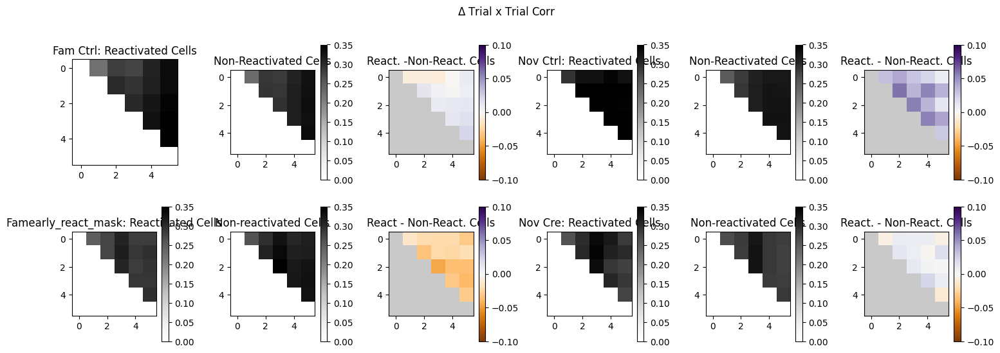

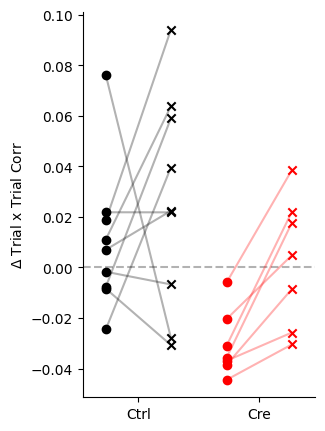

In [22]:
fig, ax = plt.subplots(2,6, figsize = [18,6])
fig.suptitle(r'$\Delta$ Trial x Trial Corr')
fig.subplots_adjust(wspace=.5)

within_vmax = .35
h = ax[0,0].imshow(np.nanmean(ctrl_act[:, 0, :, :],axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
ax[0,0].set_title('Fam Ctrl: Reactivated Cells')
ax[0,0].set_facecolor = 'red'
h = ax[0,1].imshow(np.nanmean(ctrl_nonact[:, 0, :, :], axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[0,1])
ax[0,1].set_title('Non-Reactivated Cells')

cmap = plt.cm.PuOr
cmap.set_bad([.3, .3, .3] , .3)

h = ax[0,2].imshow(np.nanmean(ctrl_act[:, 0, :, :]-ctrl_nonact[:, 0, :, :], axis=0), cmap=cmap, vmin=-.1, vmax=.1)
fig.colorbar(h, ax=ax[0,2])
ax[0,2].set_title('React. -Non-React. Cells')

h = ax[0,3].imshow(np.nanmean(ctrl_act[:, 1, :, :],axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[0,3])
ax[0,3].set_title('Nov Ctrl: Reactivated Cells')
h = ax[0,4].imshow(np.nanmean(ctrl_nonact[:, 1, :, :], axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[0,4])
ax[0,4].set_title('Non-Reactivated Cells')
h = ax[0,5].imshow(np.nanmean(ctrl_act[:, 1, :, :]-ctrl_nonact[:, 1, :, :], axis=0), cmap=cmap, vmin=-.1, vmax=.1)
fig.colorbar(h, ax=ax[0,5])
ax[0,5].set_title('React. - Non-React. Cells')


h = ax[1,0].imshow(np.nanmean(cre_act[:, 0, :, :],axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[1,0])
ax[1,0].set_title('Famearly_react_mask: Reactivated Cells')
h = ax[1,1].imshow(np.nanmean(cre_nonact[:, 0, :, :], axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[1,1])
ax[1,1].set_title('Non-reactivated Cells')

diff = np.nanmean(cre_act[:, 0, :, :]-cre_nonact[:, 0, :, :], axis=0)
print(diff)
h = ax[1,2].imshow(np.nanmean(cre_act[:, 0, :, :]-cre_nonact[:, 0, :, :], axis=0), cmap=cmap, vmin=-.1, vmax=.1)
fig.colorbar(h, ax=ax[1,2])
ax[1,2].set_title('React - Non-React. Cells')

h = ax[1,3].imshow(np.nanmean(cre_act[:, 1, :, :],axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[1,3])
ax[1,3].set_title('Nov Cre: Reactivated Cells')
h = ax[1,4].imshow(np.nanmean(cre_nonact[:, 1, :, :], axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[1,4])
ax[1,4].set_title('Non-reactivated Cells')
h = ax[1,5].imshow(np.nanmean(cre_act[:, 1, :, :]-cre_nonact[:, 1, :, :], axis=0), cmap=cmap, vmin=-.1, vmax=.1)
fig.colorbar(h, ax=ax[1,5])
ax[1,5].set_title('React. - Non-React. Cells')


fig.savefig(os.path.join(figdir, 'trial_x_trial_corr_across_days.pdf'))
ctrl_diff = np.nanmean(np.nanmean(ctrl_act, axis=-1), axis=-1) - np.nanmean(np.nanmean(ctrl_nonact, axis=-1), axis=-1)
cre_diff = np.nanmean(np.nanmean(cre_act, axis=-1), axis=-1) - np.nanmean(np.nanmean(cre_nonact, axis=-1), axis=-1)
print('fam')
t,p = sp.stats.ttest_ind(ctrl_diff[:,0], cre_diff[:,0])
print('ctrl vs cre', t,p)
t,p = sp.stats.ttest_1samp(ctrl_diff[:,0], 0)
print('ctrl', t,p)
t,p = sp.stats.ttest_1samp(cre_diff[:,0], 0)
print('cre', t,p)

print('nov')
t,p = sp.stats.ttest_ind(ctrl_diff[:,1], cre_diff[:,1])
print('ctrl vs cre', t,p)
t,p = sp.stats.ttest_1samp(ctrl_diff[:,1], 0)
print('ctrl', t,p)
t,p = sp.stats.ttest_1samp(cre_diff[:,1], 0)
print('cre', t,p)

print('fam v nov')
t,p = sp.stats.ttest_ind(ctrl_diff[:,0], ctrl_diff[:,1])
print('ctrl', t,p)
t,p = sp.stats.ttest_ind(cre_diff[:,0], cre_diff[:,1])
print('cre', t,p)



aov = mixed_anova(data = df, dv='corr_diff', between='cond', within='ttype', subject='mouse')
print(aov)
posthoc = pairwise_tests(data = df, dv='corr_diff', between='cond', within='ttype', subject='mouse', padjust = 'holm')
print(posthoc)


fig, ax = plt.subplots(figsize=[3,5], sharey=True)
key = 'corr_diff'
mask = (df['cond']=='ctrl')
for mouse in ctrl_mice:
    _mask = mask & (df['mouse']==mouse)
    _df = df[_mask]
    lr = [_df[key].loc[_df['ttype']=='fam']._values, _df[key].loc[_df['ttype']=='nov']._values]

    ax.plot(np.array([-1,-.3]), lr, color='black', alpha = .3)
    # ax[0].scatter(5*day + np.array([-1,-.3]), lr, color='black', alpha = .3)
    ax.scatter(- 1,lr[0], color='black', alpha = 1, marker='o')
    ax.scatter(- .3, lr[1], color='black', alpha = 1, marker='x')

mask = (df['cond']=='cre') 
for mouse in ko_mice:
    _mask = mask & (df['mouse']==mouse)
    _df = df[_mask]
    lr = [_df[key].loc[_df['ttype']=='fam']._values, _df[key].loc[_df['ttype']=='nov']._values]

    ax.plot( np.array([.3,1]), lr, color='red', alpha = .3)
    ax.scatter( .3,lr[0], color='red', alpha = 1, marker='o')
    ax.scatter( 1, lr[1], color='red', alpha = 1, marker='x')
ax.plot([-1.25, 1.25], [0, 0], 'k--', alpha=.3, zorder=-1)
ax.set_xlim([-1.25,1.25])
ax.set_xticks([(-1-.3)/2, (.3+1)/2], labels=['Ctrl', 'Cre'])
ax.set_ylabel(r'$\Delta$ Trial x Trial Corr')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


fig.savefig(os.path.join(figdir, 'trial_x_trial_corr_summary.pdf'))

# avg ratemap correlation across days

In [23]:
#  correlation of rate map across days 

def predict_across_day_stability(mouse):
    print(mouse)
    if mouse in ctrl_mice:
        cond_key='ctrl'
    else:
        cond_key='cre'
    corr_dict = {}
    # common_roi_mapping = common_rois_adjust(mouse, np.arange(6))
    for react_day in range(5):
        corr_dict[react_day] = {}
        for tt_corr_day in range(react_day+1,6):
            corr_dict[react_day][tt_corr_day] ={}
            days = [react_day, tt_corr_day]

            common_roi_mapping = common_rois_adjust(mouse, days)
            


            with open(hse_dict[cond_key][react_day][mouse], 'rb') as file:
                hse_react = pickle.load(file)

            
            
            # trial matrix 
            with open(hse_dict[cond_key][tt_corr_day][mouse], 'rb') as file:
                hse_fut = pickle.load(file)
              
            
            for key, coef  in zip(('fam', 'nov'), (-1,1)):
                corr_dict[react_day][tt_corr_day][key] = {}
                # try:
                    # reactivation mask 
                react_mask = hse_react.post_reward_coactive_mask[common_roi_mapping[0,:],:][:, hse_react.lr==coef*hse_react.novel_arm].sum(axis=-1)>0
                tmat_react = np.nanmean(hse_react.trial_mat[:, :, common_roi_mapping[0, :]][hse_react.trial_info['LR'] == coef*hse_react.novel_arm, :, :], axis=0)
                tmat_fut = np.nanmean(hse_fut.trial_mat[:, : , common_roi_mapping[1, :]][hse_fut.trial_info['LR'] == coef*hse_fut.novel_arm, :, :], axis=0)
                # react_mask = hse_react.post_reward_coactive_mask[common_roi_mapping[react_day,:],:][:, hse_react.lr==coef*hse_react.novel_arm].sum(axis=-1)>0
                # tmat_react = np.nanmean(hse_react.trial_mat[:, :, common_roi_mapping[react_day, :]][hse_react.trial_info['LR'] == coef*hse_react.novel_arm, :, :], axis=0)
                # tmat_fut = np.nanmean(hse_fut.trial_mat[:, : , common_roi_mapping[tt_corr_day, :]][hse_fut.trial_info['LR'] == coef*hse_fut.novel_arm, :, :], axis=0)


                ## trial x trial correlation
                tmat_react = sp.stats.zscore(tmat_react, axis=0, nan_policy='omit')
                tmat_react[np.isnan(tmat_react)]=0

                tmat_fut = sp.stats.zscore(tmat_fut, axis=0, nan_policy='omit')
                tmat_fut[np.isnan(tmat_fut)]=0


                cc_corr = 1/(tmat_react.shape[0]-1)*np.matmul(tmat_react.T, tmat_fut)
                cc_corr = cc_corr[np.diag_indices_from(cc_corr)]


                corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
                corr_dict[react_day][tt_corr_day][key]['nonactivated']=np.nanmean(cc_corr[~react_mask])
                # except:
                #     corr_dict[react_day][tt_corr_day][key]['activated']=np.nan
                #     corr_dict[react_day][tt_corr_day][key]['nonactivated']=np.nan
                    
    return corr_dict

In [24]:
ctrl_dayxday_corr_results = {mouse:predict_across_day_stability(mouse) for mouse in ctrl_mice}    
ko_dayxday_corr_results = {mouse:predict_across_day_stability(mouse) for mouse in ko_mice}    

4467331.1
4467331.2
[3, 4]
[3, 4]
[3, 4]
[3, 4]


/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])


[3, 4]


/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])


4467332.1
4467332.2
[2, 3]
[2, 3]
[2, 3]
[2, 3]
[2, 3]
4467333.1
mCherry6


/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py

mCherry7


/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])


mCherry8


/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])


mCherry9


/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py

4467975.1
4467975.2
4467975.3
4467975.4
4467975.5
Cre7


/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py:55: RuntimeWarning: Mean of empty slice
  corr_dict[react_day][tt_corr_day][key]['activated']=np.nanmean(cc_corr[react_mask])
/tmp/ipykernel_50570/3023745524.py

Cre9


In [25]:
if True:
    filename = f'{basedir}/ctrl_dayxday_corr.pkl'
    with open(filename, 'wb') as file:
        pickle.dump(ctrl_dayxday_corr_results,file)

    filename = f'{basedir}/cre_dayxday_corr.pkl'
    with open(filename, 'wb') as file:
        pickle.dump(ko_dayxday_corr_results,file)

In [26]:
filename = f'{basedir}/ctrl_dayxday_corr.pkl'
with open(filename, 'rb') as file:
    ctrl_dayxday_corr_results = pickle.load(file)
    
filename = f'{basedir}/cre_dayxday_corr.pkl'
with open(filename, 'rb') as file:
    ko_dayxday_corr_results = pickle.load(file)

In [27]:
ctrl_act = np.nan*np.zeros((len(ctrl_mice),2,6,6))
ctrl_nonact = np.nan*np.zeros((len(ctrl_mice),2,6,6))
    
    
    
df = {'mouse': [],
      'cond': [],
      'ttype': [],
      'corr_act': [],
      'corr_nonact': [],
      'corr_diff': [],
     }

for m, mouse in enumerate(ctrl_mice):
    
    res = ctrl_dayxday_corr_results[mouse]
     
    for nov_ind, key in enumerate(['fam', 'nov']):
        for r_day in res.keys():
            for tt_day in res[r_day].keys():
                
                ctrl_act[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['activated'])
                ctrl_nonact[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['nonactivated'])
    
for m, mouse in enumerate(ctrl_mice):
    for n, key in enumerate(['fam', 'nov']):
        df['mouse'].append(mouse)
        df['cond'].append('ctrl')
        df['ttype'].append(key)
        df['corr_act'].append(np.nanmean(np.nanmean(ctrl_act[m,n,:,:], axis=-1), axis=-1))
        df['corr_nonact'].append(np.nanmean(np.nanmean(ctrl_nonact[m,n,:,:], axis=-1), axis=-1))
        df['corr_diff'].append(np.nanmean(np.nanmean(ctrl_act[m,n,:,:], axis=-1), axis=-1) - np.nanmean(np.nanmean(ctrl_nonact[m,n,:,:], axis=-1), axis=-1))
    
    
cre_act = np.nan*np.zeros((len(ko_mice),2, 6, 6))
cre_nonact = np.nan*np.zeros((len(ko_mice),2, 6,6))
                    
for m, mouse in enumerate(ko_mice):
    
    
    res = ko_dayxday_corr_results[mouse]
    
    
    for nov_ind, key in enumerate(['fam', 'nov']):
        for r_day in res.keys():
            for tt_day in res[r_day].keys():
                          
                cre_act[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['activated'])
                cre_nonact[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['nonactivated'])
                

                          
for m, mouse in enumerate(ko_mice):
    for n, key in enumerate(['fam', 'nov']):
        df['mouse'].append(mouse)
        df['cond'].append('cre')
        df['ttype'].append(key)
        df['corr_act'].append(np.nanmean(np.nanmean(cre_act[m,n,:,:], axis=-1), axis=-1))
        df['corr_nonact'].append(np.nanmean(np.nanmean(cre_nonact[m,n,:,:], axis=-1), axis=-1))
        df['corr_diff'].append(np.nanmean(np.nanmean(cre_act[m,n,:,:], axis=-1), axis=-1) - np.nanmean(np.nanmean(cre_nonact[m,n,:,:], axis=-1), axis=-1))
df = pd.DataFrame(df)

/tmp/ipykernel_50570/2237383997.py:22: RuntimeWarning: Mean of empty slice
  ctrl_act[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['activated'])
/tmp/ipykernel_50570/2237383997.py:30: RuntimeWarning: Mean of empty slice
  df['corr_act'].append(np.nanmean(np.nanmean(ctrl_act[m,n,:,:], axis=-1), axis=-1))
/tmp/ipykernel_50570/2237383997.py:31: RuntimeWarning: Mean of empty slice
  df['corr_nonact'].append(np.nanmean(np.nanmean(ctrl_nonact[m,n,:,:], axis=-1), axis=-1))
/tmp/ipykernel_50570/2237383997.py:32: RuntimeWarning: Mean of empty slice
  df['corr_diff'].append(np.nanmean(np.nanmean(ctrl_act[m,n,:,:], axis=-1), axis=-1) - np.nanmean(np.nanmean(ctrl_nonact[m,n,:,:], axis=-1), axis=-1))
/tmp/ipykernel_50570/2237383997.py:48: RuntimeWarning: Mean of empty slice
  cre_act[m, nov_ind, r_day, tt_day] = np.nanmean(res[r_day][tt_day][key]['activated'])
/tmp/ipykernel_50570/2237383997.py:58: RuntimeWarning: Mean of empty slice
  df['corr_act'].append(np.nanmean(np.nanmean(

/tmp/ipykernel_50570/3680277728.py:7: RuntimeWarning: Mean of empty slice
  h = ax[0,0].imshow(np.nanmean(ctrl_act[:, 0, :, :],axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
/tmp/ipykernel_50570/3680277728.py:10: RuntimeWarning: Mean of empty slice
  h = ax[0,1].imshow(np.nanmean(ctrl_nonact[:, 0, :, :], axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
/tmp/ipykernel_50570/3680277728.py:13: RuntimeWarning: Mean of empty slice
  h = ax[0,2].imshow(np.nanmean(ctrl_act[:, 0, :, :]-ctrl_nonact[:, 0, :, :], axis=0), cmap=cmap, vmin=-1*across_vmax, vmax=across_vmax)
/tmp/ipykernel_50570/3680277728.py:17: RuntimeWarning: Mean of empty slice
  h = ax[0,3].imshow(np.nanmean(ctrl_act[:, 1, :, :],axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
/tmp/ipykernel_50570/3680277728.py:20: RuntimeWarning: Mean of empty slice
  h = ax[0,4].imshow(np.nanmean(ctrl_nonact[:, 1, :, :], axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
/tmp/ipykernel_50570/3680277728.py:23: RuntimeWarning: Mean of empty slic

fam
ctrl vs cre 3.3767537313242135 0.004517021132342453
ctrl 1.1739092192350444 0.2741920226137685
cre -4.365861564920378 0.004740251867041754
nov
ctrl vs cre 1.7490908478371123 0.10215478753102873
ctrl 2.435082718051156 0.04087684676653126
cre 1.1447501191089793 0.29591496684648727
fam v nov
ctrl -1.8183732302143012 0.08777651291851919
cre -3.8050909445023735 0.0025064968224475788
        Source        SS  DF1  DF2        MS          F     p-unc       np2  \
0         cond  0.024576    1   14  0.024576   7.285803  0.017283  0.342285   
1        ttype  0.022866    1   14  0.022866  10.642630  0.005672  0.431879   
2  Interaction  0.000116    1   14  0.000116   0.053883  0.819797  0.003834   

   eps  
0  NaN  
1  1.0  
2  NaN  
       Contrast ttype    A     B Paired Parametric         T        dof  \
0         ttype     -  fam   nov   True       True -3.370326  15.000000   
1          cond     -  cre  ctrl  False       True -3.020544   9.698172   
2  ttype * cond   fam  cre  ctrl  Fal

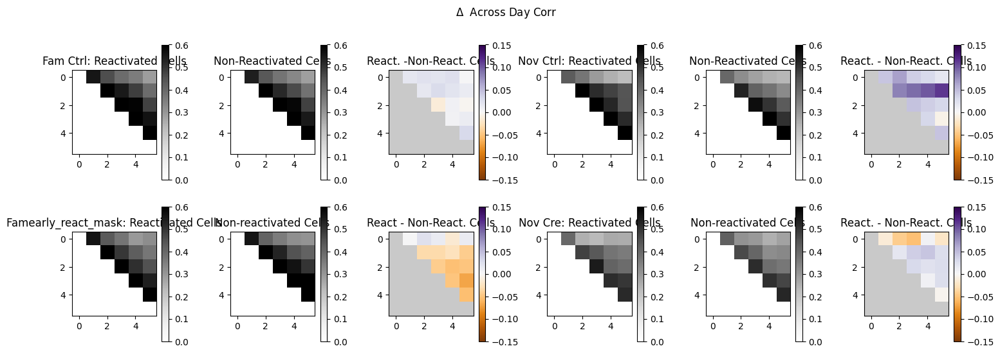

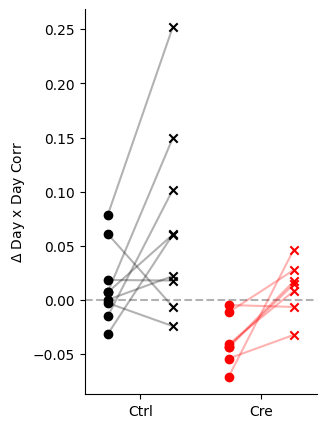

In [28]:
fig, ax = plt.subplots(2,6, figsize = [18,6])
fig.suptitle(r'$\Delta$  Across Day Corr')
fig.subplots_adjust(wspace=.5)

within_vmax = .6
across_vmax = .15
h = ax[0,0].imshow(np.nanmean(ctrl_act[:, 0, :, :],axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[0,0])
ax[0,0].set_title('Fam Ctrl: Reactivated Cells')
h = ax[0,1].imshow(np.nanmean(ctrl_nonact[:, 0, :, :], axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[0,1])
ax[0,1].set_title('Non-Reactivated Cells')
h = ax[0,2].imshow(np.nanmean(ctrl_act[:, 0, :, :]-ctrl_nonact[:, 0, :, :], axis=0), cmap=cmap, vmin=-1*across_vmax, vmax=across_vmax)
fig.colorbar(h, ax=ax[0,2])
ax[0,2].set_title('React. -Non-React. Cells')

h = ax[0,3].imshow(np.nanmean(ctrl_act[:, 1, :, :],axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[0,3])
ax[0,3].set_title('Nov Ctrl: Reactivated Cells')
h = ax[0,4].imshow(np.nanmean(ctrl_nonact[:, 1, :, :], axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[0,4])
ax[0,4].set_title('Non-Reactivated Cells')
h = ax[0,5].imshow(np.nanmean(ctrl_act[:, 1, :, :]-ctrl_nonact[:, 1, :, :], axis=0), cmap=cmap, vmin=-1*across_vmax, vmax=across_vmax)
fig.colorbar(h, ax=ax[0,5])
ax[0,5].set_title('React. - Non-React. Cells')


h = ax[1,0].imshow(np.nanmean(cre_act[:, 0, :, :],axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[1,0])
ax[1,0].set_title('Famearly_react_mask: Reactivated Cells')
h = ax[1,1].imshow(np.nanmean(cre_nonact[:, 0, :, :], axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[1,1])
ax[1,1].set_title('Non-reactivated Cells')
h = ax[1,2].imshow(np.nanmean(cre_act[:, 0, :, :]-cre_nonact[:, 0, :, :], axis=0), cmap=cmap, vmin=-1*across_vmax, vmax=across_vmax)
fig.colorbar(h, ax=ax[1,2])
ax[1,2].set_title('React - Non-React. Cells')

h = ax[1,3].imshow(np.nanmean(cre_act[:, 1, :, :],axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[1,3])
ax[1,3].set_title('Nov Cre: Reactivated Cells')
h = ax[1,4].imshow(np.nanmean(cre_nonact[:, 1, :, :], axis=0), cmap='Greys', vmin=0, vmax=within_vmax)
fig.colorbar(h, ax=ax[1,4])
ax[1,4].set_title('Non-reactivated Cells')
h = ax[1,5].imshow(np.nanmean(cre_act[:, 1, :, :]-cre_nonact[:, 1, :, :], axis=0), cmap=cmap, vmin=-1*across_vmax, vmax=across_vmax)
fig.colorbar(h, ax=ax[1,5])
ax[1,5].set_title('React. - Non-React. Cells')


fig.savefig(os.path.join(figdir, 'day_x_day_corr.pdf'))
ctrl_diff = np.nanmean(np.nanmean(ctrl_act, axis=-1), axis=-1) - np.nanmean(np.nanmean(ctrl_nonact, axis=-1), axis=-1)
cre_diff = np.nanmean(np.nanmean(cre_act, axis=-1), axis=-1) - np.nanmean(np.nanmean(cre_nonact, axis=-1), axis=-1)
print('fam')
t,p = sp.stats.ttest_ind(ctrl_diff[:,0], cre_diff[:,0])
print('ctrl vs cre', t,p)
t,p = sp.stats.ttest_1samp(ctrl_diff[:,0], 0)
print('ctrl', t,p)
t,p = sp.stats.ttest_1samp(cre_diff[:,0], 0)
print('cre', t,p)

print('nov')
t,p = sp.stats.ttest_ind(ctrl_diff[:,1], cre_diff[:,1])
print('ctrl vs cre', t,p)
t,p = sp.stats.ttest_1samp(ctrl_diff[:,1], 0)
print('ctrl', t,p)
t,p = sp.stats.ttest_1samp(cre_diff[:,1], 0)
print('cre', t,p)

print('fam v nov')
t,p = sp.stats.ttest_ind(ctrl_diff[:,0], ctrl_diff[:,1])
print('ctrl', t,p)
t,p = sp.stats.ttest_ind(cre_diff[:,0], cre_diff[:,1])
print('cre', t,p)



aov = mixed_anova(data = df, dv='corr_diff', between='cond', within='ttype', subject='mouse')
print(aov)
posthoc = pairwise_tests(data = df, dv='corr_diff', between='cond', within='ttype', subject='mouse', padjust = 'holm')
print(posthoc)


fig, ax = plt.subplots(figsize=[3,5], sharey=True)
key = 'corr_diff'
mask = (df['cond']=='ctrl')
for mouse in ctrl_mice:
    _mask = mask & (df['mouse']==mouse)
    _df = df[_mask]
    lr = [_df[key].loc[_df['ttype']=='fam']._values, _df[key].loc[_df['ttype']=='nov']._values]

    ax.plot(np.array([-1,-.3]), lr, color='black', alpha = .3)
    # ax[0].scatter(5*day + np.array([-1,-.3]), lr, color='black', alpha = .3)
    ax.scatter(- 1,lr[0], color='black', alpha = 1, marker='o')
    ax.scatter(- .3, lr[1], color='black', alpha = 1, marker='x')

mask = (df['cond']=='cre') 
for mouse in ko_mice:
    _mask = mask & (df['mouse']==mouse)
    _df = df[_mask]
    lr = [_df[key].loc[_df['ttype']=='fam']._values, _df[key].loc[_df['ttype']=='nov']._values]

    ax.plot( np.array([.3,1]), lr, color='red', alpha = .3)
    ax.scatter( .3,lr[0], color='red', alpha = 1, marker='o')
    ax.scatter( 1, lr[1], color='red', alpha = 1, marker='x')
ax.plot([-1.25, 1.25], [0, 0], 'k--', alpha=.3, zorder=-1)
ax.set_xlim([-1.25,1.25])
ax.set_xticks([(-1-.3)/2, (.3+1)/2], labels=['Ctrl', 'Cre'])
ax.set_ylabel(r'$\Delta$ Day x Day Corr')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


fig.savefig(os.path.join(figdir, 'day_x_day_corr_summary.pdf'))

# proportion of events a cell participates in 


In [145]:

df = {'ctrl/cre':[], 
      'day':[], 
      'mouse': [], 
      'm': [], 
      'nov_prop_sig_events':[], 
      'fam_prop_sig_events': [], 
      }
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice[:-1], ko_mice)):
    for day in range(6):
        for m, mouse in enumerate(mice):
            print(mouse,day)
            with open(hse_dict[cond_key][day][mouse], 'rb') as file:
                hse = pickle.load(file)
                
                
            nov_N= 0
            nov_active_count = np.zeros((hse.spks.shape[0],))
            fam_N = 0
            fam_active_count = np.zeros((hse.spks.shape[0],))
            pop_starts = np.argwhere(hse.pop_coactivity_th[1:]>hse.pop_coactivity_th[:-1]).ravel()-1
            pop_ends = np.argwhere(hse.pop_coactivity_th[1:]<hse.pop_coactivity_th[:-1]).ravel()+1
            for start, stop in zip(pop_starts, pop_ends):
                if hse.lr[start]==hse.novel_arm:    
                    nov_active_count += hse.post_reward_coactive_mask[:, start:stop].sum(axis=-1)>0
                    nov_N += 1
                else:
                    fam_active_count += hse.post_reward_coactive_mask[:, start:stop].sum(axis=-1)>0
                    fam_N += 1
                    
            if nov_N<5:
                nov_N = -1
            if fam_N<5:
                fam_N = -1
            # nov_N, fam_N = np.maximum(nov_N, 1E-5), np.maximum(fam_N, 1E-5)
            nov_active_count/=nov_N
            fam_active_count/=fam_N
            
            
            df['ctrl/cre'].append(cond_key)
            df['day'].append(day)
            df['mouse'].append(mouse)
            df['m'].append(m)
            df['nov_prop_sig_events'].append(nov_active_count[nov_active_count>0].mean())
            df['fam_prop_sig_events'].append(fam_active_count[fam_active_count>0].mean())

df = pd.DataFrame(df)
            




4467331.1 0
4467331.2 0
4467332.1 0
4467332.2 0
4467333.1 0
mCherry6 0


/tmp/ipykernel_2678494/32680572.py:43: RuntimeWarning: Mean of empty slice.
  df['nov_prop_sig_events'].append(nov_active_count[nov_active_count>0].mean())
/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


mCherry7 0


/tmp/ipykernel_2678494/32680572.py:44: RuntimeWarning: Mean of empty slice.
  df['fam_prop_sig_events'].append(fam_active_count[fam_active_count>0].mean())


mCherry8 0
4467331.1 1
4467331.2 1
4467332.1 1
4467332.2 1
4467333.1 1
mCherry6 1
mCherry7 1
mCherry8 1
4467331.1 2
4467331.2 2
4467332.1 2
4467332.2 2
4467333.1 2
mCherry6 2
mCherry7 2
mCherry8 2
4467331.1 3
4467331.2 3
4467332.1 3
4467332.2 3
4467333.1 3
mCherry6 3
mCherry7 3
mCherry8 3
4467331.1 4
4467331.2 4
4467332.1 4
4467332.2 4
4467333.1 4
mCherry6 4
mCherry7 4
mCherry8 4
4467331.1 5
4467331.2 5
4467332.1 5
4467332.2 5
4467333.1 5
mCherry6 5
mCherry7 5
mCherry8 5
4467975.1 0
4467975.2 0
4467975.3 0
4467975.4 0
4467975.5 0
Cre7 0
Cre9 0
4467975.1 1
4467975.2 1
4467975.3 1
4467975.4 1
4467975.5 1
Cre7 1
Cre9 1
4467975.1 2
4467975.2 2
4467975.3 2
4467975.4 2
4467975.5 2
Cre7 2
Cre9 2
4467975.1 3
4467975.2 3
4467975.3 3
4467975.4 3
4467975.5 3
Cre7 3
Cre9 3
4467975.1 4
4467975.2 4
4467975.3 4
4467975.4 4
4467975.5 4
Cre7 4
Cre9 4
4467975.1 5
4467975.2 5
4467975.3 5
4467975.4 5
4467975.5 5
Cre7 5
Cre9 5


Text(0.5, 0, 'Days')

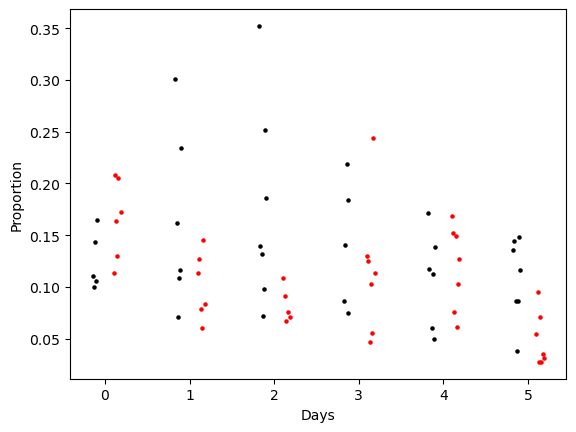

In [147]:
fig, ax = plt.subplots()

mask = df['ctrl/cre']=='ctrl'
_df = df[mask]
x = _df['day'] - _df['m']/len(ctrl_mice)*.1 - .1
ax.scatter(x, _df['nov_prop_sig_events'], color='black', s=5)

mask = df['ctrl/cre']=='cre'
_df = df[mask]
x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
ax.scatter(x, _df['nov_prop_sig_events'], color='red', s=5)

ax.set_ylabel('Proportion')
# ax.set_title('Fraction of eligible stopping periods with HSE')
ax.set_xlabel('Days')


In [45]:
aov = mixed_anova(data=df, dv='nov_prop_sig_events', between='ctrl/cre', within='day', subject='mouse')
print(aov)


        Source        SS  DF1  DF2        MS         F     p-unc       np2  \
0     ctrl/cre  0.000027    1    5  0.000027  0.011357  0.919275  0.002266   
1          day  0.036420    5   25  0.007284  7.308225  0.000243  0.593768   
2  Interaction  0.005935    5   25  0.001187  1.190845  0.341933  0.192356   

        eps  
0       NaN  
1  0.439016  
2       NaN  


In [46]:
aov = mixed_anova(data=df, dv='fam_prop_sig_events', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source        SS  DF1  DF2       MS         F     p-unc       np2  \
0     ctrl/cre  0.006280    1   12  0.00628  1.474203  0.248038  0.109409   
1          day  0.012102    5   60  0.00242  3.196880  0.012649  0.210364   
2  Interaction  0.015500    5   60  0.00310  4.094714  0.002896  0.254414   

        eps  
0       NaN  
1  0.395117  
2       NaN  


In [ ]:
# proportion of events that cell participates in within day and across days

# examples of reactivated cells 

In [47]:
def iou_reactivation_across_days(mouse):
    print(mouse)
    if mouse in ctrl_mice:
        cond_key='ctrl'
    else:
        cond_key='cre'
    corr_dict = {}
    for early_day in range(5):
        corr_dict[early_day] = {}
        for late_day in range(early_day+1,6):
            corr_dict[early_day][late_day] ={}
            days = [early_day, late_day]

            common_roi_mapping = common_rois_adjust(mouse, days)


            with open(hse_dict[cond_key][early_day][mouse], 'rb') as file:
                hse_early = pickle.load(file)

            with open(hse_dict[cond_key][late_day][mouse], 'rb') as file:
                hse_late = pickle.load(file)
                
            for key, coef  in zip(('fam', 'nov'), (-1,1)):
                corr_dict[early_day][late_day][key] = {}
                          
                # reactivation masks 
                early_react_mask = hse_early.post_reward_coactive_mask[common_roi_mapping[0,:],:][:, hse_early.lr==coef*hse_early.novel_arm].sum(axis=-1)>0
                late_react_mask = hse_late.post_reward_coactive_mask[common_roi_mapping[1,:],:][:, hse_late.lr==coef*hse_late.novel_arm].sum(axis=-1)>0
                # print((early_react_mask&late_react_mask).sum()/(early_react_mask|late_react_mask).sum())
                corr_dict[early_day][late_day][key]['iou'] = (early_react_mask&late_react_mask).sum()/(early_react_mask|late_react_mask).sum()

            
    return corr_dict


In [48]:
ctrl_iou_results = {mouse:iou_reactivation_across_days(mouse) for mouse in ctrl_mice[:-1]}    
ko_iou_results = {mouse:iou_reactivation_across_days(mouse) for mouse in ko_mice}    

4467331.1
4467331.2
[3, 4]
[3, 4]
[3, 4]
[3, 4]
[3, 4]
4467332.1
4467332.2
[2, 3]
[2, 3]
[2, 3]
[2, 3]
[2, 3]
4467333.1
mCherry6


/tmp/ipykernel_2678494/4170878250.py:30: RuntimeWarning: invalid value encountered in scalar divide
  corr_dict[early_day][late_day][key]['iou'] = (early_react_mask&late_react_mask).sum()/(early_react_mask|late_react_mask).sum()


mCherry7
mCherry8
4467975.1
4467975.2
4467975.3
4467975.4
4467975.5
Cre7
Cre9


In [50]:
ctrl_iou = np.nan*np.zeros((len(ctrl_mice),2,6,6))
    
for m, mouse in enumerate(ctrl_mice[:-1]):
   
    res = ctrl_iou_results[mouse]
    
    # print(res.keys())
    for nov_ind, key in enumerate(['fam', 'nov']):
        for r_day in res.keys():
            for tt_day in res[r_day].keys():
                ctrl_iou[m, nov_ind, r_day, tt_day] = res[r_day][tt_day][key]['iou']
                
    
    
cre_iou = np.nan*np.zeros((len(ko_mice),2, 6, 6))
                  
for m, mouse in enumerate(ko_mice):
    
    res = ko_iou_results[mouse]
   
    for nov_ind, key in enumerate(['fam', 'nov']):
        for r_day in res.keys():
            for tt_day in res[r_day].keys():

                cre_iou[m, nov_ind, r_day, tt_day] = res[r_day][tt_day][key]['iou']


/tmp/ipykernel_2678494/112118976.py:3: RuntimeWarning: Mean of empty slice
  h = ax[0,0].imshow(np.nanmean(ctrl_iou[:-1, 0, :, :],axis=0), cmap='Greys', vmin=0, vmax=.4)
/tmp/ipykernel_2678494/112118976.py:6: RuntimeWarning: Mean of empty slice
  h = ax[0,1].imshow(np.nanmean(cre_iou[:, 0, :, :], axis=0), cmap='Greys', vmin=0, vmax=.4)
/tmp/ipykernel_2678494/112118976.py:9: RuntimeWarning: Mean of empty slice
  h = ax[0,2].imshow(np.nanmean(ctrl_iou[:-1, 0, :, :], axis=0) - np.nanmean(cre_iou[:, 0, :, :], axis=0), cmap='RdGy', vmin=-.2, vmax=.2)
/tmp/ipykernel_2678494/112118976.py:13: RuntimeWarning: Mean of empty slice
  h = ax[1,0].imshow(np.nanmean(ctrl_iou[:-1, 1, :, :],axis=0), cmap='Greys', vmin=0, vmax=.4)
/tmp/ipykernel_2678494/112118976.py:16: RuntimeWarning: Mean of empty slice
  h = ax[1,1].imshow(np.nanmean(cre_iou[:, 1, :, :], axis=0), cmap='Greys', vmin=0, vmax=.4)
/tmp/ipykernel_2678494/112118976.py:19: RuntimeWarning: Mean of empty slice
  h = ax[1,2].imshow(np.nanmean(

fam
ctrl vs cre -1.9397092258476398 0.07442492457750156
nov
ctrl vs cre -0.014742041369713847 0.988461825342346


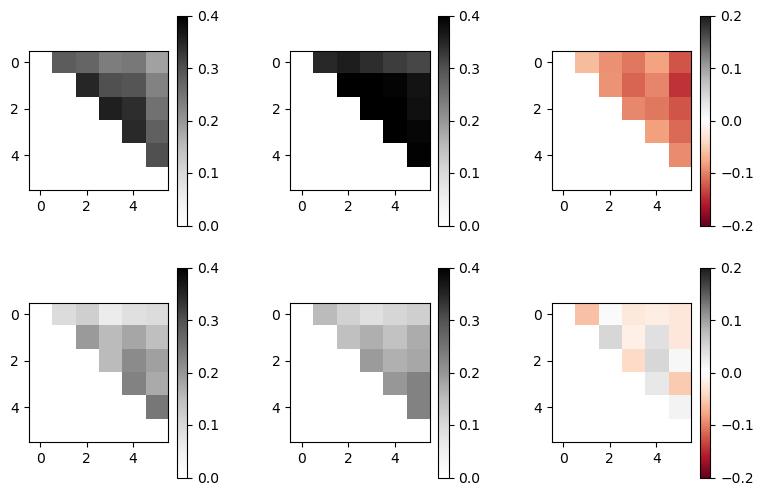

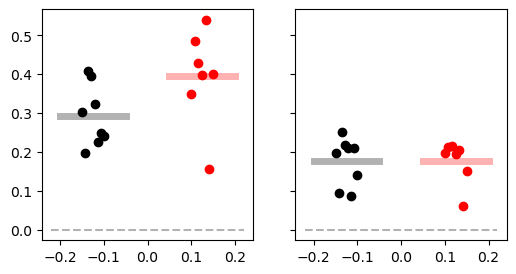

In [52]:
fig, ax = plt.subplots(2,3, figsize = [9,6])
fig.subplots_adjust(wspace=.5)
h = ax[0,0].imshow(np.nanmean(ctrl_iou[:-1, 0, :, :],axis=0), cmap='Greys', vmin=0, vmax=.4)
fig.colorbar(h, ax=ax[0,0])
# ax[0,0].set_title('Fam Ctrl: Reactivated Cells')
h = ax[0,1].imshow(np.nanmean(cre_iou[:, 0, :, :], axis=0), cmap='Greys', vmin=0, vmax=.4)
fig.colorbar(h, ax=ax[0,1])
# ax[0,1].set_title('Non-Reactivated Cells')
h = ax[0,2].imshow(np.nanmean(ctrl_iou[:-1, 0, :, :], axis=0) - np.nanmean(cre_iou[:, 0, :, :], axis=0), cmap='RdGy', vmin=-.2, vmax=.2)
fig.colorbar(h, ax=ax[0,2])
# ax[0,2].set_title('React. -Non-React. Cells')

h = ax[1,0].imshow(np.nanmean(ctrl_iou[:-1, 1, :, :],axis=0), cmap='Greys', vmin=0, vmax=.4)
fig.colorbar(h, ax=ax[1,0])
# ax[0,0].set_title('Fam Ctrl: Reactivated Cells')
h = ax[1,1].imshow(np.nanmean(cre_iou[:, 1, :, :], axis=0), cmap='Greys', vmin=0, vmax=.4)
fig.colorbar(h, ax=ax[1,1])
# ax[0,1].set_title('Non-Reactivated Cells')
h = ax[1,2].imshow(np.nanmean(ctrl_iou[:-1, 1, :, :], axis=0) - np.nanmean(cre_iou[:, 1, :, :], axis=0), cmap='RdGy', vmin=-.2, vmax=.2)
fig.colorbar(h, ax=ax[1,2])
# ax[0,2].set_title('React. -Non-React. Cells')


fig, ax= plt.subplots(1,2, figsize = [6,3], sharey=True)
ctrl_x = np.linspace(-.15,-.1, num=len(ctrl_mice)-1)
cre_x = np.linspace(.1,.15, num=len(ko_mice))

ctrl_iou_mu = np.nanmean(np.nanmean(ctrl_iou[:-1, :, :, :],axis=-1), axis=-1)
cre_iou_mu = np.nanmean(np.nanmean(cre_iou,axis=-1), axis=-1)




ax[0].scatter(ctrl_x, ctrl_iou_mu[:, 0], color='black')
ax[0].plot([-.2,-.05], ctrl_iou_mu[:,0].mean()*np.ones((2,)), color='black', alpha=.3, linewidth=5)
ax[0].scatter(cre_x, cre_iou_mu[:, 0], color='red')
ax[0].plot([.05,.2], cre_iou_mu[:,0].mean()*np.ones((2,)), color='red', alpha=.3, linewidth=5)
ax[0].plot([-.22, .22], [0, 0], 'k--', alpha=.3, zorder=-1)
print('fam')
t,p = sp.stats.ttest_ind(ctrl_iou_mu[:,0], cre_iou_mu[:,0])
print('ctrl vs cre', t,p)



ax[1].scatter(ctrl_x, ctrl_iou_mu[:, 1], color='black')
ax[1].plot([-.2,-.05], ctrl_iou_mu[:,1].mean()*np.ones((2,)), color='black', alpha=.3, linewidth=5)
ax[1].scatter(cre_x, cre_iou_mu[:, 1], color='red')
ax[1].plot([.05,.2], cre_iou_mu[:,1].mean()*np.ones((2,)), color='red', alpha=.3, linewidth=5)
ax[1].plot([-.22, .22], [0, 0], 'k--', alpha=.3, zorder=-1)
print('nov')
t,p = sp.stats.ttest_ind(ctrl_iou_mu[:,1], cre_iou_mu[:,1])
print('ctrl vs cre', t,p)



In [92]:
with open(hse_dict[cond][react_day][mouse], 'rb') as file:
    hse = pickle.load(file)
    


In [99]:
# sess.novel_arm
sess.rzone_early['tfront']-sess.trial_matrices['bin_centers'][0]

19.17690445738824

In [93]:

cell = 16
trial = np.zeros(hse.lr.shape)*np.nan
nov_t = 0
for i, (start, stop) in enumerate(zip(hse.trial_start_inds, hse.teleport_inds)):
    # trial[start:stop]==i
    
    if hse.lr[start] == hse.novel_arm:
        trial[start:stop]=nov_t 
        nov_t+=1

trial_mask = hse.post_reward_coactive_mask[common_roi_mapping[react_day,:],:][cell, hse.lr==nov_coef*hse.novel_arm]>0
trial_react = trial[hse.lr==nov_coef*hse.novel_arm]
trial_react = trial_react[trial_mask]
print(trial_react)
print(hse.novel_arm)

# react_mask = hse.post_reward_coactive_mask[common_roi_mapping[react_day,:],:][:, hse.lr==nov_coef*hse.novel_arm].sum(axis=-1)>0
# react_mask.shape

[ 0.  0.  0.  3.  3.  3.  3.  6. 14. 14. 14. 14. 17. 17. 17.]
-1


In [96]:
sess.

array([nan, nan, nan, ..., nan, nan, nan])

In [106]:
# plot cells that are reactivated vs non-reactivated across days
cond = 'ctrl'
nov_coef = 1
mouse = ctrl_mice[0]
days = np.arange(6)
common_roi_mapping = common_rois_adjust(mouse, days)

# load common session
sess = u.single_mouse_concat_sessions(mouse, days, load_stats=True, load_ops=True)

react_day = 1
# load day 2 hse
with open(hse_dict[cond][react_day][mouse], 'rb') as file:
    hse = pickle.load(file)
react_mask = hse.post_reward_coactive_mask[common_roi_mapping[react_day,:],:][:, hse.lr==nov_coef*hse.novel_arm].sum(axis=-1)>0

non_react_mask = np.zeros((common_roi_mapping.shape[1],))
for day in range(react_day):
    with open(hse_dict[cond][day][mouse], 'rb') as file:
        hse_prev = pickle.load(file)
    
    _non_react_mask = hse_prev.post_reward_coactive_mask[common_roi_mapping[day,:],:][:, hse_prev.lr==nov_coef*hse_prev.novel_arm].sum(axis=-1)==0
    print(_non_react_mask.sum(), (~_non_react_mask).sum())
    non_react_mask = non_react_mask + _non_react_mask
non_react_mask = non_react_mask==0


29_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
01_12_2020 YMaze_LNovel
02_12_2020 YMaze_LNovel
03_12_2020 YMaze_LNovel
04_12_2020 YMaze_LNovel
335 41


In [107]:
# find cells that are reactivated on day 2
# print(np.argwhere(react_mask & non_react_mask).ravel())
# cell_inds = np.argwhere(react_mask & non_react_mask).ravel()
react_cell_inds = np.argwhere(react_mask&~non_react_mask).ravel()
nonreact_cell_inds = np.argwhere(non_react_mask & ~react_mask).ravel()
print(react_cell_inds)

[ 76 115 116 155 195 219 235 243 246 354 355 360 373]


In [108]:
def plot_cell_across_days(sess, cell):
    fig = plt.figure(figsize = [20, 5])
    gs = gridspec.GridSpec(6, 5, figure=fig)
    mean = np.nanmean(sess.trial_matrices['spks'][:,:,cell].ravel())
    for day in range(6):
        fam_mask = (sess.trial_info['sess_num']==day) & (sess.trial_info['LR']==-1*sess.novel_arm)
        nov_mask = (sess.trial_info['sess_num']==day) & (sess.trial_info['LR']==sess.novel_arm)
        fam_trialmat = sess.trial_matrices['spks'][fam_mask,:,:][:,:,cell]
        nov_trialmat = sess.trial_matrices['spks'][nov_mask,:,:][:,:,cell]


        fam_trialmat[np.isnan(fam_trialmat)]=1E-3
        nov_trialmat[np.isnan(nov_trialmat)]=1E-3

        day_inds = sess.trial_info['sess_num'][sess.trial_info['LR']==-1*sess.novel_arm]==day
        fam_ax = fig.add_subplot(gs[day,0])
        h = fam_ax.imshow(fam_trialmat/mean, cmap = 'magma', aspect='auto', vmin = 0, vmax=5, interpolation=None)

        nov_ax = fig.add_subplot(gs[day,1])
        nov_ax.imshow(nov_trialmat/mean, cmap = 'magma', aspect='auto', vmin = 0, vmax=5, interpolation=None)
        
        # nov_ax.set_yticks(np.arange(0, nov_trialmat.shape[0],5))
        if day<5:
            fam_ax.set_xticks([])
            nov_ax.set_xticks([])
        else:
            fam_ax.set_xticks((-.5, 9.5, 19.5, 29.5))
            fam_ax.set_xticklabels((0,100,200,300))

            nov_ax.set_xticks((-.5, 9.5, 19.5, 29.5))
            nov_ax.set_xticklabels((0,100,200,300))


    cbar_ax = fig.add_subplot(gs[2:4,2])
    plt.colorbar(h,ax=cbar_ax)

    day0_com = (sess.s2p_stats[0][cell]['xpix'].mean(), sess.s2p_stats[0][cell]['ypix'].mean())
    day5_com = (sess.s2p_stats[len(sess.s2p_stats)-1][cell]['xpix'].mean(), sess.s2p_stats[len(sess.s2p_stats)-1][cell]['ypix'].mean())

    day0img = np.zeros([100,100,3])

    x_edges = (int(day0_com[1]-50), int(day0_com[1]+50))
    y_edges = ( int(day0_com[0]-50), int(day0_com[0]+50))
    g_img = sess.s2p_ops[0]['meanImg'][x_edges[0]:x_edges[1], y_edges[0]:y_edges[1]]
    r_img = sess.s2p_ops[0]['meanImg_chan2'][x_edges[0]:x_edges[1], y_edges[0]:y_edges[1]]
    day0img[:,:,1] = g_img/np.amax(g_img)
    day0img[:,:,0] = r_img/np.amax(r_img)
    day0img[:,:,2] = r_img/np.amax(r_img)

    day0_ax = fig.add_subplot(gs[1:5,3])
    day0_ax.imshow(day0img,cmap='Greys_r')

    circle = plt.Circle((50,50), 7, fill=False, color='blue',linewidth=3)
    day0_ax.add_patch(circle)

    day5img = np.zeros([100,100,3])

    x_edges = (int(day5_com[1]-50), int(day5_com[1]+50))
    y_edges = ( int(day5_com[0]-50), int(day5_com[0]+50))
    g_img = sess.s2p_ops[len(sess.s2p_stats)-1]['meanImg'][x_edges[0]:x_edges[1], y_edges[0]:y_edges[1]]
    r_img = sess.s2p_ops[len(sess.s2p_stats)-1]['meanImg_chan2'][x_edges[0]:x_edges[1], y_edges[0]:y_edges[1]]
    day5img[:,:,1] = g_img/np.amax(g_img)
    day5img[:,:,0] = r_img/np.amax(r_img)
    day5img[:,:,2] = r_img/np.amax(r_img)

    day5_ax = fig.add_subplot(gs[1:5,4])
    day5_ax.imshow(day5img,cmap='Greys_r')


    circle = plt.Circle((50,50), 7, fill=False, color='blue',linewidth=3)
    day5_ax.add_patch(circle)

    fig.suptitle("cell %d" % cell)
    return fig
    # if save:
    #     mouse_dir = os.path.join(figdir, sess.mouse)
    #     os.makedirs(mouse_dir,exist_ok = True)
    #     fig.savefig(os.path.join(mouse_dir,"cell%d.pdf" % cell),format = 'pdf')


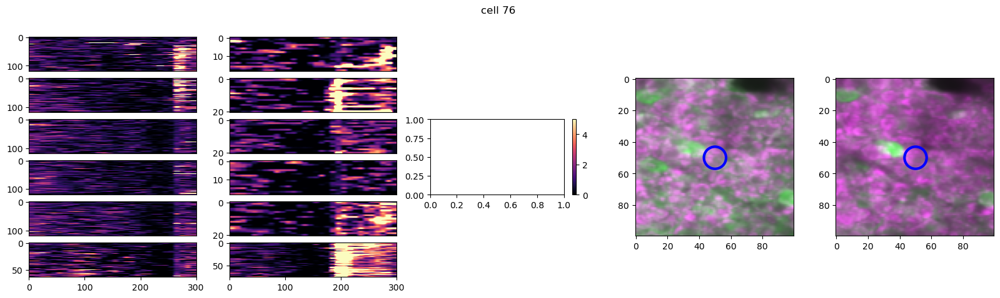

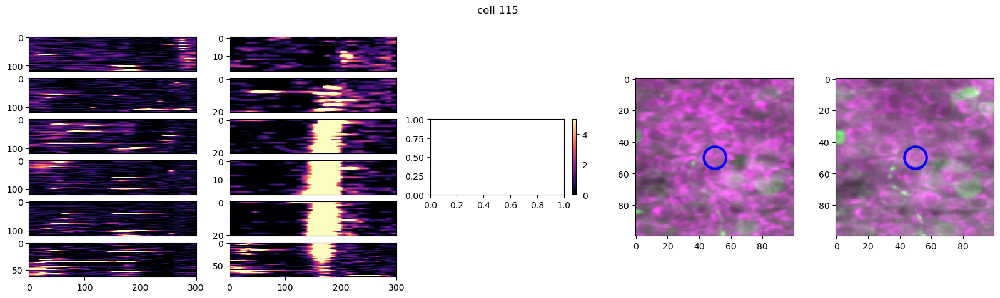

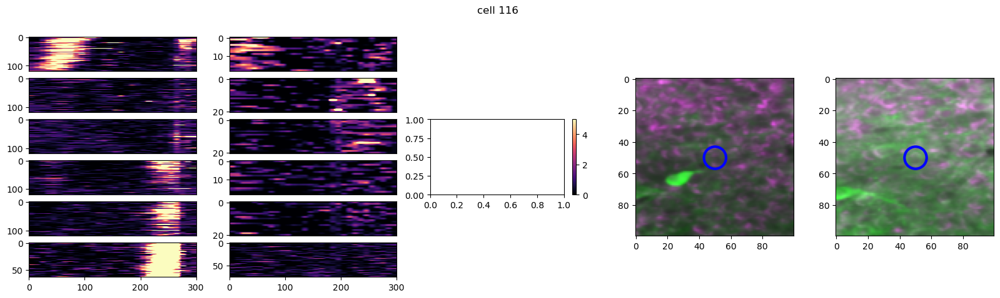

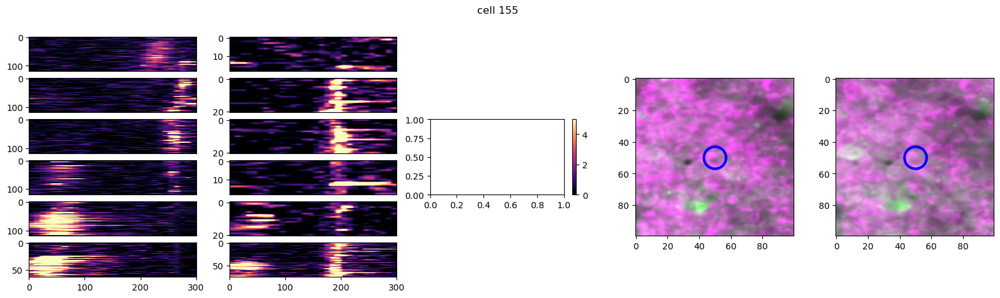

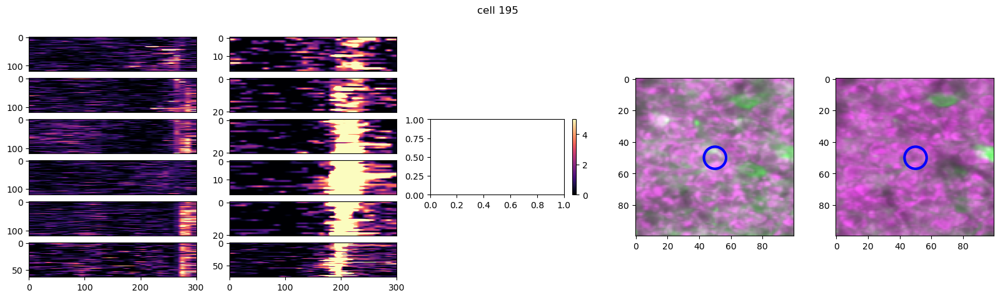

...

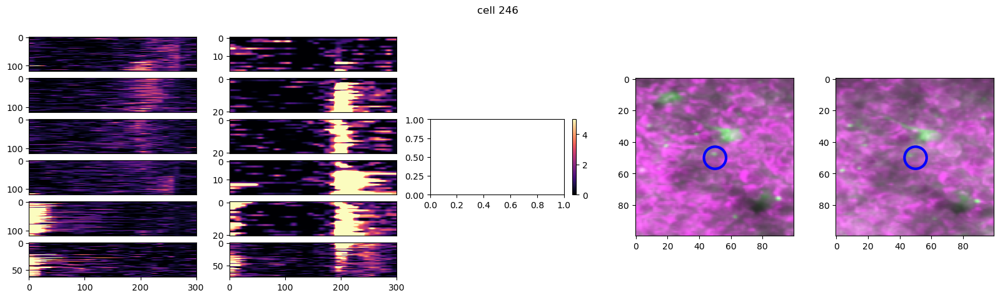

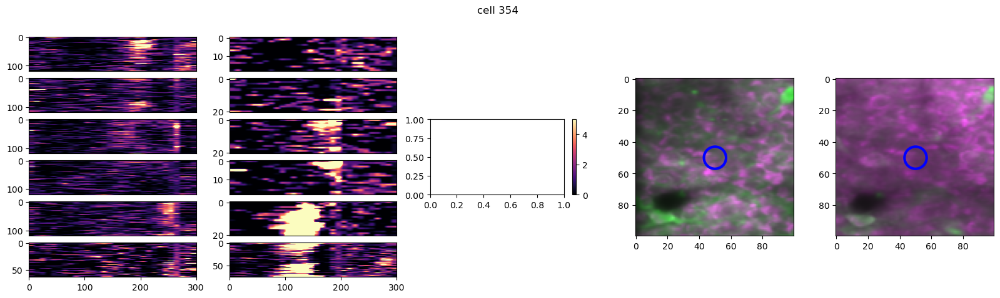

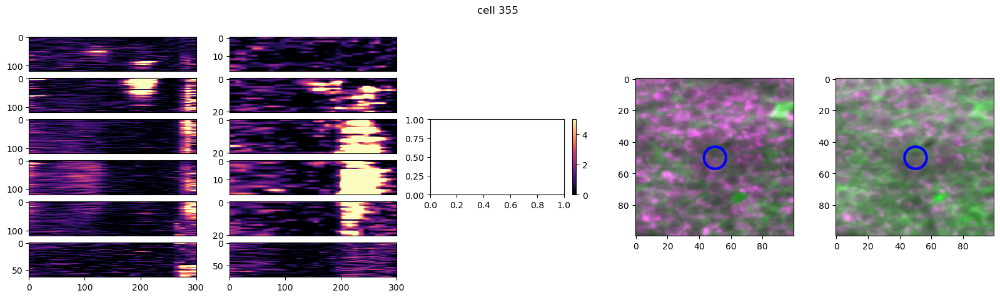

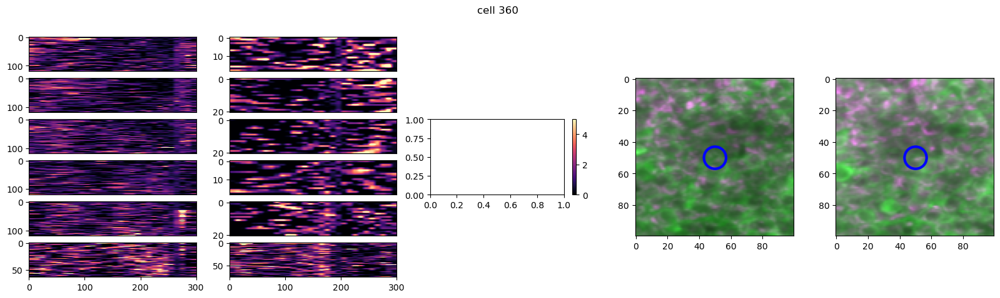

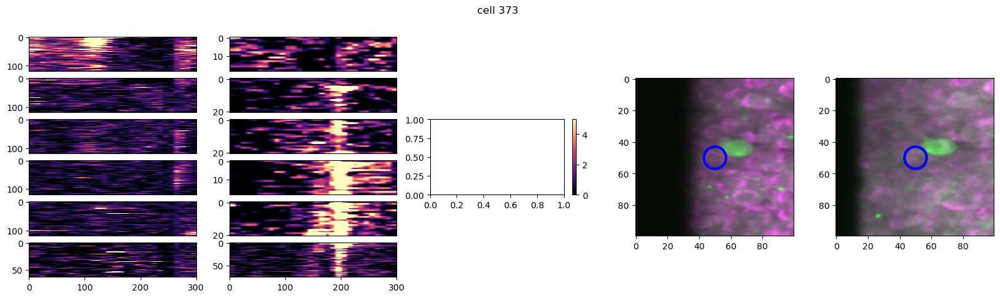

In [109]:
if nov_coef == 1:
    outputdir = os.path.join(figdir, mouse, f'day_{react_day}', 'nov_reactivated_cells')
else:
    outputdir = os.path.join(figdir, mouse, f'day_{react_day}', 'fam_reactivated_cells')
os.makedirs(outputdir, exist_ok=True)
for cell in react_cell_inds:
    fig = plot_cell_across_days(sess, cell)
    fig.savefig(os.path.join(outputdir, f'cell_{cell}.pdf'))

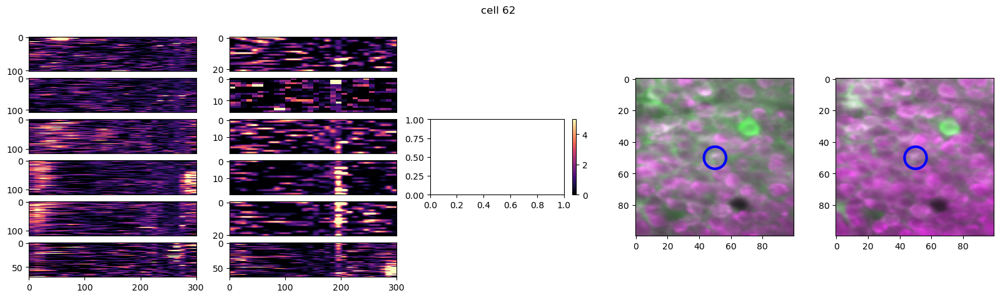

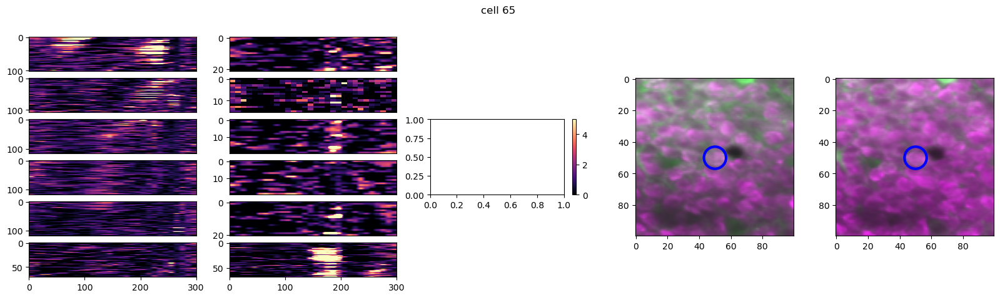

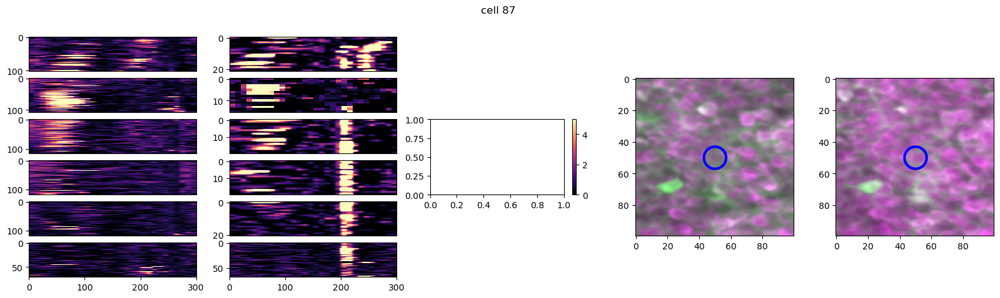

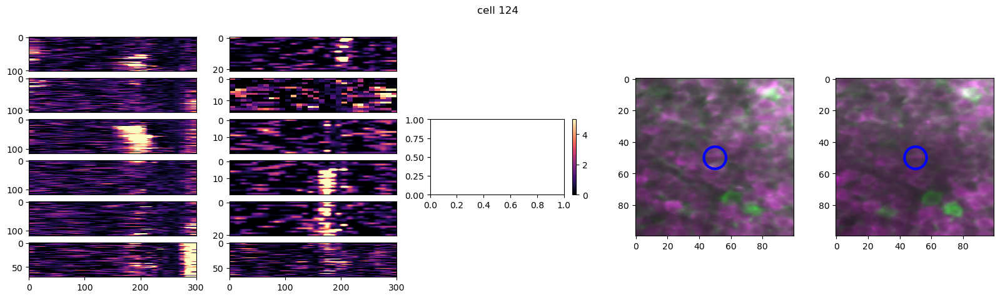

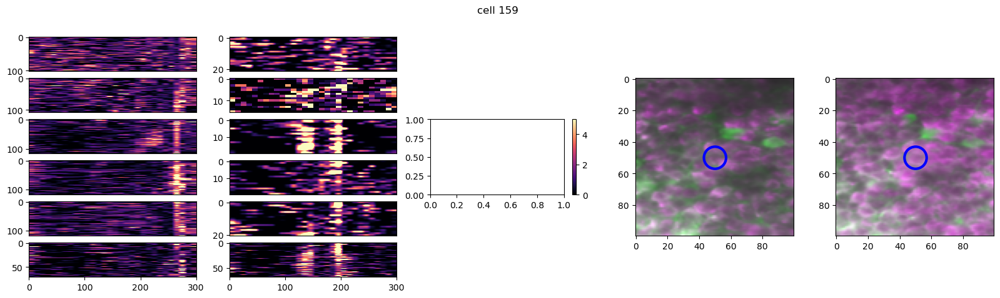

In [144]:
if nov_coef == 1:
    outputdir = os.path.join(figdir, mouse, f'day_{react_day}', 'nov_nonreactivated_cells')
else:
    outputdir = os.path.join(figdir, mouse, f'day_{react_day}', 'fam_nonreactivated_cells')
os.makedirs(outputdir, exist_ok=True)
for cell in nonreact_cell_inds:
    plot_cell_across_days(sess, cell)
    fig.savefig(os.path.join(outputdir, f'cell_{cell}.pdf'))